# Imports

In [ ]:
import pandas as pd 
import numpy as np
from pyomo.environ import *
from scipy import stats
from collections import defaultdict
from pyomo.common.timing import HierarchicalTimer
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
import sys

# Data Processing

In [ ]:
# Reading in dataframe
df = pd.read_csv('stock_prices.csv', index_col=0)
df

,AAPL,MSFT,GOOG,GOOGL,AMZN,BRK.B,TSLA,UNH,XOM,JNJ,...,DXC,AIZ,LUMN,DVA,OGN,ALK,LNC,NWL,VNO,TAP
Date,,,,,,,,,,,,,,,,,,,,,
Jan-10,6.8594,28.1800,27.7723,13.2615,6.2705,76.43,1.5887,33.00,64.43,62.86,...,25.4835,31.43,34.01,29.880,35.75,7.8350,24.58,26.44,47.3428,42.00
Feb-10,7.3078,28.6700,26.2609,13.1828,5.9200,80.13,1.3293,33.86,65.00,63.00,...,25.7269,30.52,34.27,30.805,30.26,8.7500,25.18,25.69,48.1041,40.38
Mar-10,8.3928,29.2875,27.9179,14.1918,6.7885,81.27,1.2987,32.67,66.98,65.20,...,27.0682,34.38,35.46,31.700,29.01,10.3075,30.70,25.48,55.4090,42.06
Apr-10,9.3246,30.5350,28.6852,13.1551,6.8550,77.00,1.3603,30.31,67.77,64.30,...,26.0250,36.43,34.11,31.215,33.89,10.3525,30.59,27.63,61.0231,44.36
May-10,9.1743,25.8000,28.5017,12.1525,6.2730,70.55,1.4560,29.07,60.46,58.30,...,24.8328,34.70,34.33,31.715,32.79,11.6750,26.46,23.58,56.8582,41.04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Sep-19,55.9925,139.0300,NaN,61.0570,86.7955,208.02,44.5322,217.32,70.61,129.38,...,29.5000,125.82,12.48,57.070,NaN,64.9100,60.32,NaN,63.6700,57.50
Oct-19,62.1900,143.3700,NaN,62.9400,88.8330,212.58,34.9330,252.70,67.57,132.04,...,27.6700,126.07,12.94,58.600,NaN,69.4300,56.48,NaN,65.6300,52.72
Nov-19,66.8125,151.3800,NaN,65.2045,90.0400,220.30,52.1248,279.87,68.13,137.49,...,37.3300,132.87,14.49,71.770,NaN,69.0100,59.05,NaN,64.5700,50.48


In [ ]:
print("Total number of stocks:", len(df.columns))
print("Stocks with some null values for Jan 2010 to Jan 2020:", len(df.columns[df.isnull().any()]))

Total number of stocks: 503
Stocks with some null values for Jan 2010 to Jan 2020: 54


In [ ]:
# Dropping stocks with any null values for time period
clean_df=df.dropna(axis=1,how='any')
print("Number of stocks without any null values:", len(clean_df.columns))
clean_df

Number of stocks without any null values: 449


,AAPL,MSFT,GOOGL,AMZN,BRK.B,TSLA,UNH,XOM,JNJ,NVDA,...,MHK,XRAY,DXC,AIZ,LUMN,DVA,ALK,LNC,VNO,TAP
Date,,,,,,,,,,,,,,,,,,,,,
Jan-10,6.8594,28.1800,13.2615,6.2705,76.43,1.5887,33.00,64.43,62.86,3.8475,...,41.41,33.53,25.4835,31.43,34.01,29.880,7.8350,24.58,47.3428,42.00
Feb-10,7.3078,28.6700,13.1828,5.9200,80.13,1.3293,33.86,65.00,63.00,4.0500,...,51.58,33.09,25.7269,30.52,34.27,30.805,8.7500,25.18,48.1041,40.38
Mar-10,8.3928,29.2875,14.1918,6.7885,81.27,1.2987,32.67,66.98,65.20,4.3500,...,54.38,34.88,27.0682,34.38,35.46,31.700,10.3075,30.70,55.4090,42.06
Apr-10,9.3246,30.5350,13.1551,6.8550,77.00,1.3603,30.31,67.77,64.30,3.9275,...,63.74,36.65,26.0250,36.43,34.11,31.215,10.3525,30.59,61.0231,44.36
May-10,9.1743,25.8000,12.1525,6.2730,70.55,1.4560,29.07,60.46,58.30,3.2850,...,56.16,32.43,24.8328,34.70,34.33,31.715,11.6750,26.46,56.8582,41.04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Sep-19,55.9925,139.0300,61.0570,86.7955,208.02,44.5322,217.32,70.61,129.38,43.5175,...,124.07,53.31,29.5000,125.82,12.48,57.070,64.9100,60.32,63.6700,57.50
Oct-19,62.1900,143.3700,62.9400,88.8330,212.58,34.9330,252.70,67.57,132.04,50.2550,...,143.38,54.78,27.6700,126.07,12.94,58.600,69.4300,56.48,65.6300,52.72
Nov-19,66.8125,151.3800,65.2045,90.0400,220.30,52.1248,279.87,68.13,137.49,54.1850,...,139.37,56.54,37.3300,132.87,14.49,71.770,69.0100,59.05,64.5700,50.48


In [ ]:
returns = clean_df.pct_change(1).dropna()
returns

,AAPL,MSFT,GOOGL,AMZN,BRK.B,TSLA,UNH,XOM,JNJ,NVDA,...,MHK,XRAY,DXC,AIZ,LUMN,DVA,ALK,LNC,VNO,TAP
Date,,,,,,,,,,,,,,,,,,,,,
Feb-10,0.065370,0.017388,-0.005934,-0.055897,0.048410,-0.163278,0.026061,0.008847,0.002227,0.052632,...,0.245593,-0.013123,0.009551,-0.028953,0.007645,0.030957,0.116784,0.024410,0.016081,-0.038571
Mar-10,0.148471,0.021538,0.076539,0.146706,0.014227,-0.023020,-0.035145,0.030462,0.034921,0.074074,...,0.054285,0.054095,0.052136,0.126474,0.034724,0.029054,0.178000,0.219222,0.151856,0.041605
Apr-10,0.111024,0.042595,-0.073049,0.009796,-0.052541,0.047432,-0.072238,0.011795,-0.013804,-0.097126,...,0.172122,0.050745,-0.038540,0.059628,-0.038071,-0.015300,0.004366,-0.003583,0.101321,0.054684
May-10,-0.016119,-0.155068,-0.076214,-0.084902,-0.083766,0.070352,-0.040911,-0.107865,-0.093313,-0.163590,...,-0.118921,-0.115143,-0.045810,-0.047488,0.006450,0.016018,0.127747,-0.135011,-0.068251,-0.074842
Jun-10,-0.020830,-0.108140,-0.083769,-0.129125,0.129554,0.617651,-0.023048,-0.056070,0.013036,-0.222983,...,-0.185185,-0.077706,-0.094822,0.000000,-0.029712,-0.015608,-0.037473,-0.082011,-0.060890,0.032164
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Sep-19,0.072962,0.008487,0.025711,-0.022733,0.022664,0.026776,-0.071282,0.031104,0.007946,0.039162,...,0.043570,0.022244,-0.111981,0.022927,0.096661,0.012418,0.086906,0.140696,0.052919,0.119548
Oct-19,0.110684,0.031216,0.030840,0.023475,0.021921,-0.215556,0.162801,-0.043053,0.020560,0.154823,...,0.155638,0.027575,-0.062034,0.001987,0.036859,0.026809,0.069635,-0.063660,0.030784,-0.083130
Nov-19,0.074329,0.055869,0.035979,0.013587,0.036316,0.492136,0.107519,0.008288,0.041275,0.078201,...,-0.027968,0.032129,0.349115,0.053938,0.119784,0.224744,-0.006049,0.045503,-0.016151,-0.042489


In [ ]:
def get_sectors(count):
    sectors_df = pd.read_csv('market_sector.csv')[list(returns.columns)]
    sectors_df = sectors_df.transpose().sample(n=count,axis='rows',random_state=613)
    sectors = sectors_df.to_dict()[0]
    stocks_and_sectors = {}
    for key, val in sorted(sectors.items()):
        val = val.upper()
        l = stocks_and_sectors.get(val)
        if l is None:
            stocks_and_sectors.update({val: [key]})
        else:
            l.append(key)
            stocks_and_sectors.update({val: l})
    return stocks_and_sectors

# Model Parameter Methods

In [ ]:
# geometric mean
def geometric_mean(df):
    geometric_mean = np.array((((df + 1).prod())**(1/df.shape[0]) ) - 1)
    return geometric_mean

# Model Development

In [ ]:
def solve_mvo(stock_count, constraints=[], r=0.0):
    returns_df = returns.sample(n=stock_count,axis='columns', random_state=613)
    # mean model parameter
    gmeans = geometric_mean(returns_df)
    # covariance model parameter
    cov = returns_df.cov().stack().to_dict()
    corr = returns_df.corr().to_dict()

    stocks = list(returns_df.columns)
    mean = (pd.DataFrame((np.expand_dims(gmeans, axis=1)), index=stocks).to_dict())[0]
    model = ConcreteModel()
    model.x = Var(stocks, within=NonNegativeReals )
    model.c = ConstraintList()
    model.c.add(sum(mean[s]*model.x[s] for s in stocks) >= r)
    model.c.add(sum(model.x[s] for s in stocks) == 1 )
    for cn in constraints:
        model.c.add(sum(model.x[s] for s in cn['stocks']) <= cn['limit'])
        model.c.add(sum(model.x[s] for s in cn['stocks']) >= cn['min'])
            
    def objrule(model):
        return 0.5*sum(cov[s, t]*model.x[s]*model.x[t] for s in stocks for t in stocks)
    
    model.obj = Objective(rule=objrule, sense=minimize)
    
    return (model, stocks, mean, cov, corr)

In [ ]:
def get_contraints(stocks_and_sectors, n):
    keys = list(stocks_and_sectors.keys())
    constraints = []
    for i in range((n-3)+2):
        constraint = {'stocks': stocks_and_sectors[keys[i]], 'limit': 1, 'min': 0.1}
        constraints.append(constraint)
    return constraints

# Optimization

In [ ]:
def optimize_portfolio(solver_alg):
    solver_path = '/Users/preeti/6800/solvers/' + solver_alg
    num_constraints = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
    variables = [100, 150, 200, 250, 300]
    min_return = [0.0, 0.01, 0.02, 0.03, 0.04]
    timer = HierarchicalTimer()
    sensitivity = {}
    covariances = {}
    correlations = {}
    for r in min_return:
        time_data = {}
        variance_data = {}
        expected_return_data = {}
        print("Min Expected Return", r)
        for n in num_constraints:
            times = {}  
            variances = {}
            expected_returns = {}
            print("Number of Constraints", n)
            for v in variables:
                stocks_and_sectors = get_sectors(v)
                constraints = get_contraints(stocks_and_sectors, n)
                model, stocks, mean, cov, corr = solve_mvo(v, constraints, r)
                timer.start('solve-' + str(n) + "-"  + str(v))
                solver = SolverFactory(solver_alg, executable=solver_path)
                solver.solve(model, report_timing=True)
                timer.stop('solve-' + str(n) + "-" + str(v))
                times.update({v: timer.get_total_time('solve-' + str(n) + "-"  + str(v))})

                expected_return = 0
                for s in stocks:
                    expected_return += mean[s]*model.x[s]()
                print("Variance : ", model.obj())
                print("Expected Return : ", expected_return)
                print("Time : ", timer.get_total_time('solve-' + str(n) + "-"  + str(v)))
                variances.update({v: model.obj()})
                expected_returns.update({v: expected_return})
                print()
                if r == 0.0 and n == 2:
                    covariances.update({v: cov})
                    correlations.update({v: corr})
                    
            print()
            time_data.update({n: times})
            variance_data.update({n: variances})
            expected_return_data.update({n: expected_returns})
        d = {'time': time_data, 'variance': variance_data, 'return': expected_return_data}
        sensitivity.update({r: d})
    return sensitivity, covariances, correlations

In [ ]:
conopt, covariances, correlations = optimize_portfolio('conopt')

Min Expected Return 0.0
Number of Constraints 2
        0.15 seconds required to write file
        0.15 seconds required for presolve
        0.07 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.00 seconds required for postsolve
Variance :  0.0001654435252267956
Expected Return :  0.010381450190225763
Time :  0.22509042099999998

        0.29 seconds required to write file
        0.29 seconds required for presolve
        0.13 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.02 seconds required for postsolve
Variance :  0.00012564043894211857
Expected Return :  0.012257900655373681
Time :  0.44590164799999954

        0.53 seconds required to write file
        0.53 seconds required for presolve
        0.20 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds require

        0.30 seconds required to write file
        0.30 seconds required for presolve
        0.21 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.01 seconds required for postsolve
Variance :  0.00015037214293191448
Expected Return :  0.011876014725098201
Time :  0.5252375660000013

        0.59 seconds required to write file
        0.59 seconds required for presolve
        0.21 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.00 seconds required for postsolve
Variance :  0.00016340422208710806
Expected Return :  0.012231577837182378
Time :  0.808654825000005

        0.89 seconds required to write file
        0.90 seconds required for presolve
        0.30 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.00 seconds requi

Variance :  0.0008823660100811445
Expected Return :  0.012773928778798757
Time :  1.8324846390000005

        1.60 seconds required to write file
        1.60 seconds required for presolve
        0.39 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: CONOPT 3.17A\x3a Infeasible; objective
        0.0008398950991270215; 5 iterations; evals\x3a nf = 2, ng = 1, nc = 4,
        nJ = 0, nH = 0, nHv = 0
        0.01 seconds required for postsolve
Variance :  0.0008398950991270208
Expected Return :  0.013269866919547504
Time :  2.0015903190000017

        2.08 seconds required to write file
        2.08 seconds required for presolve
        0.51 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condi

        0.01 seconds required for postsolve
Variance :  0.0009312932105545476
Expected Return :  0.011627528785378899
Time :  0.6770492750000017

        0.85 seconds required to write file
        0.85 seconds required for presolve
        0.21 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: CONOPT 3.17A\x3a Infeasible; objective
        0.001107032498315221; 4 iterations; evals\x3a nf = 2, ng = 1, nc = 2,
        nJ = 0, nH = 0, nHv = 0
        0.01 seconds required for postsolve
Variance :  0.0011070324983152217
Expected Return :  0.012562687380386975
Time :  1.060686378000014

        1.18 seconds required to write file
        1.18 seconds required for presolve
        0.29 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model

        0.01 seconds required for postsolve
Variance :  0.0008591665076166147
Expected Return :  0.012117049316233633
Time :  0.30657131800001025

        0.53 seconds required to write file
        0.53 seconds required for presolve
        0.18 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: CONOPT 3.17A\x3a Infeasible; objective
        0.0007615946715866294; 4 iterations; evals\x3a nf = 2, ng = 1, nc = 2,
        nJ = 0, nH = 0, nHv = 0
        0.01 seconds required for postsolve
Variance :  0.0007615946715866297
Expected Return :  0.011994299747011996
Time :  0.7200205740000172

        0.96 seconds required to write file
        0.96 seconds required for presolve
        0.27 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    mo

Variance :  0.00011441161640396755
Expected Return :  0.011977175114159294
Time :  2.2342715809999945

        1.11 seconds required to write file
        1.11 seconds required for presolve
        0.50 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.01 seconds required for postsolve
Variance :  9.764453413684066e-05
Expected Return :  0.012426663882816035
Time :  3.2321479409999903

        1.55 seconds required to write file
        1.55 seconds required for presolve
        0.87 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.01 seconds required for postsolve
Variance :  6.746035313274053e-05
Expected Return :  0.013150442582845782
Time :  4.878603405000007

        2.00 seconds required to write file
        2.00 seconds required for presolve
        1.25 seconds required for solver
        0.00 seconds req

Variance :  0.00019595636225770282
Expected Return :  0.012803871955738287
Time :  3.686090772999961

        1.57 seconds required to write file
        1.57 seconds required for presolve
        0.69 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.01 seconds required for postsolve
Variance :  0.00014795073068187624
Expected Return :  0.01397879593063127
Time :  4.960295427999981

        2.05 seconds required to write file
        2.05 seconds required for presolve
        0.94 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.01 seconds required for postsolve
Variance :  0.0001371367591462875
Expected Return :  0.014364489887425648
Time :  6.609884378999965


Number of Constraints 7
        0.14 seconds required to write file
        0.14 seconds required for presolve
        0.05 seconds required for solver
 

        0.01 seconds required for postsolve
Variance :  0.000572003956230802
Expected Return :  0.018134434356716644
Time :  2.123709715999979

        1.24 seconds required to write file
        1.24 seconds required for presolve
        0.35 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: CONOPT 3.17A\x3a Infeasible; objective
        0.0007596710907051648; 6 iterations; evals\x3a nf = 2, ng = 1, nc = 5,
        nJ = 0, nH = 0, nHv = 0
        0.01 seconds required for postsolve
Variance :  0.0007596710907051651
Expected Return :  0.017284725148468304
Time :  3.1562700910000103

        1.53 seconds required to write file
        1.54 seconds required for presolve
        0.38 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model

        0.00 seconds required for postsolve
Variance :  0.0008961315679924305
Expected Return :  0.019775666273657053
Time :  0.8509138730000245

        0.53 seconds required to write file
        0.54 seconds required for presolve
        0.13 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: CONOPT 3.17A\x3a Infeasible; objective
        0.0007720384507066705; 5 iterations; evals\x3a nf = 2, ng = 1, nc = 4,
        nJ = 0, nH = 0, nHv = 0
        0.00 seconds required for postsolve
Variance :  0.0007720384507066699
Expected Return :  0.019427919528021236
Time :  1.3188217459999692

        0.81 seconds required to write file
        0.81 seconds required for presolve
        0.23 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    mod

        0.01 seconds required for postsolve
Variance :  0.0008335557787918024
Expected Return :  0.022116192374195244
Time :  5.502902546999991


Min Expected Return 0.02
Number of Constraints 2
        0.15 seconds required to write file
        0.15 seconds required for presolve
        0.06 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.00 seconds required for postsolve
Variance :  0.0005983652837714518
Expected Return :  0.02
Time :  0.6651922470000171

        0.31 seconds required to write file
        0.31 seconds required for presolve
        0.10 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.00 seconds required for postsolve
Variance :  0.0002867663897394511
Expected Return :  0.019999999999999993
Time :  1.2583063970000516

        0.58 seconds required to write file
        0.58 seconds required f

Variance :  0.0001152865828254263
Expected Return :  0.02
Time :  10.215040096000024


Number of Constraints 5
        0.13 seconds required to write file
        0.13 seconds required for presolve
        0.05 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: CONOPT 3.17A\x3a Infeasible; objective
        0.00166418684178854; 7 iterations; evals\x3a nf = 2, ng = 1, nc = 6,
        nJ = 0, nH = 0, nHv = 0
        0.00 seconds required for postsolve
Variance :  0.0016641868417885401
Expected Return :  0.019220643463909948
Time :  0.6122995310000192

        0.29 seconds required to write file
        0.29 seconds required for presolve
        0.10 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.00 seconds required for postsolve


        0.01 seconds required for postsolve
Variance :  0.0008988671894737845
Expected Return :  0.02
Time :  2.0999810739999987

        0.79 seconds required to write file
        0.79 seconds required for presolve
        0.19 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: CONOPT 3.17A\x3a Infeasible; objective
        0.000733502811276989; 6 iterations; evals\x3a nf = 2, ng = 1, nc = 5,
        nJ = 0, nH = 0, nHv = 0
        0.01 seconds required for postsolve
Variance :  0.0007335028112769882
Expected Return :  0.020000000000000004
Time :  3.370283388000047

        1.16 seconds required to write file
        1.17 seconds required for presolve
        0.28 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";

        0.00 seconds required for postsolve
Variance :  0.001223080330559155
Expected Return :  0.01836642046668322
Time :  0.6118409219999705

        0.28 seconds required to write file
        0.29 seconds required for presolve
        0.08 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: CONOPT 3.17A\x3a Infeasible; objective
        0.0008766240446919794; 5 iterations; evals\x3a nf = 2, ng = 1, nc = 4,
        nJ = 0, nH = 0, nHv = 0
        0.01 seconds required for postsolve
Variance :  0.0008766240446919795
Expected Return :  0.02
Time :  1.1946200990000762

        0.51 seconds required to write file
        0.51 seconds required for presolve
        0.13 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";

        0.01 seconds required for postsolve
Variance :  0.0008995551674696635
Expected Return :  0.02437658172420362
Time :  6.323097764999915

        2.00 seconds required to write file
        2.00 seconds required for presolve
        0.51 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: CONOPT 3.17A\x3a Infeasible; objective
        0.0010166798488648596; 5 iterations; evals\x3a nf = 2, ng = 1, nc = 4,
        nJ = 0, nH = 0, nHv = 0
        0.01 seconds required for postsolve
Variance :  0.001016679848864861
Expected Return :  0.0247353768563704
Time :  8.17239061999993


Number of Constraints 11
        0.14 seconds required to write file
        0.14 seconds required for presolve
        0.05 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read so

        0.45 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.00 seconds required for postsolve
Variance :  0.003183625796433063
Expected Return :  0.03
Time :  9.534386581999934

        2.01 seconds required to write file
        2.02 seconds required for presolve
        0.60 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.01 seconds required for postsolve
Variance :  0.003183625796433061
Expected Return :  0.030000000000000002
Time :  12.47240335899993


Number of Constraints 3
        0.14 seconds required to write file
        0.14 seconds required for presolve
        0.05 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: CONOPT 3.17A

        0.05 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: CONOPT 3.17A\x3a Infeasible; objective
        0.0016641868417885395; 7 iterations; evals\x3a nf = 2, ng = 1, nc = 6,
        nJ = 0, nH = 0, nHv = 0
        0.00 seconds required for postsolve
Variance :  0.0016641868417885397
Expected Return :  0.019220643463909944
Time :  0.8110647100000392

        0.29 seconds required to write file
        0.29 seconds required for presolve
        0.08 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: CONOPT 3.17A\x3a Infeasible; objective
        0.0015580657922553787; 8 iterations; evals\x3a nf = 2, ng = 1, nc = 7,
        nJ = 0, nH = 0, n

        0.38 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: CONOPT 3.17A\x3a Infeasible; objective
        0.0026445701518713447; 7 iterations; evals\x3a nf = 2, ng = 1, nc = 6,
        nJ = 0, nH = 0, nHv = 0
        0.01 seconds required for postsolve
Variance :  0.0026445701518713455
Expected Return :  0.027246599516471688
Time :  9.14772930499997

        2.02 seconds required to write file
        2.02 seconds required for presolve
        0.49 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: CONOPT 3.17A\x3a Infeasible; objective
        0.0026445701518713425; 7 iterations; evals\x3a nf = 2, ng = 1, nc = 6,
        nJ = 0, nH = 0, nHv

        0.19 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: CONOPT 3.17A\x3a Infeasible; objective
        0.0023735575125762827; 7 iterations; evals\x3a nf = 2, ng = 1, nc = 6,
        nJ = 0, nH = 0, nHv = 0
        0.01 seconds required for postsolve
Variance :  0.0023735575125762827
Expected Return :  0.02426901658883405
Time :  4.096860147999934

        1.16 seconds required to write file
        1.16 seconds required for presolve
        0.28 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: CONOPT 3.17A\x3a Infeasible; objective
        0.0025455528874066694; 7 iterations; evals\x3a nf = 2, ng = 1, nc = 6,
        nJ = 0, nH = 0, nHv

        0.08 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: CONOPT 3.17A\x3a Infeasible; objective
        0.0018290056195504178; 6 iterations; evals\x3a nf = 2, ng = 1, nc = 5,
        nJ = 0, nH = 0, nHv = 0
        0.00 seconds required for postsolve
Variance :  0.0018290056195504182
Expected Return :  0.02307384920885522
Time :  1.61114371299999

        0.51 seconds required to write file
        0.51 seconds required for presolve
        0.13 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: CONOPT 3.17A\x3a Infeasible; objective
        0.0018729093437623106; 6 iterations; evals\x3a nf = 2, ng = 1, nc = 5,
        nJ = 0, nH = 0, nHv 

        0.49 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: CONOPT 3.17A\x3a Infeasible; objective
        0.0023521822764099; 6 iterations; evals\x3a nf = 2, ng = 1, nc = 5, nJ
        = 0, nH = 0, nHv = 0
        0.01 seconds required for postsolve
Variance :  0.0023521822764099006
Expected Return :  0.027993588240984038
Time :  10.517556427999835


Min Expected Return 0.04
Number of Constraints 2
        0.14 seconds required to write file
        0.14 seconds required for presolve
        0.05 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: CONOPT 3.17A\x3a Infeasible; objective
        0.0026834041877398934; 6 iterations; evals\x3a nf


        1.14 seconds required to write file
        1.14 seconds required for presolve
        0.28 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: CONOPT 3.17A\x3a Infeasible; objective
        0.010157119098875345; 7 iterations; evals\x3a nf = 2, ng = 1, nc = 5,
        nJ = 0, nH = 0, nHv = 0
        0.01 seconds required for postsolve
Variance :  0.010157119098875345
Expected Return :  0.03143208558210123
Time :  7.704063725999955

        1.55 seconds required to write file
        1.56 seconds required for presolve
        0.37 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: CONOPT 3.17A\x3a Infeasible; objective
        0.0101571190


        0.54 seconds required to write file
        0.54 seconds required for presolve
        0.13 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: CONOPT 3.17A\x3a Infeasible; objective
        0.001914103916697992; 8 iterations; evals\x3a nf = 2, ng = 1, nc = 7,
        nJ = 0, nH = 0, nHv = 0
        0.01 seconds required for postsolve
Variance :  0.0019141039166979922
Expected Return :  0.023352859915603475
Time :  3.6034935470000136

        0.77 seconds required to write file
        0.77 seconds required for presolve
        0.19 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: CONOPT 3.17A\x3a Infeasible; objective
        0.0038322



Number of Constraints 7
        0.14 seconds required to write file
        0.15 seconds required for presolve
        0.05 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: CONOPT 3.17A\x3a Infeasible; objective
        0.0012379753164006237; 6 iterations; evals\x3a nf = 2, ng = 1, nc = 5,
        nJ = 0, nH = 0, nHv = 0
        0.00 seconds required for postsolve
Variance :  0.0012379753164006241
Expected Return :  0.018359675502845674
Time :  1.0720098320000204

        0.28 seconds required to write file
        0.28 seconds required for presolve
        0.08 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: CONOPT 3.17A\x3a Infeasible; o


        1.53 seconds required to write file
        1.53 seconds required for presolve
        0.37 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: CONOPT 3.17A\x3a Infeasible; objective
        0.002644570151871341; 6 iterations; evals\x3a nf = 2, ng = 1, nc = 5,
        nJ = 0, nH = 0, nHv = 0
        0.01 seconds required for postsolve
Variance :  0.002644570151871342
Expected Return :  0.027246599516471678
Time :  9.82594984500011

        2.00 seconds required to write file
        2.00 seconds required for presolve
        0.49 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: CONOPT 3.17A\x3a Infeasible; objective
        0.0026445701


        0.77 seconds required to write file
        0.77 seconds required for presolve
        0.19 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: CONOPT 3.17A\x3a Infeasible; objective
        0.0028676674576234976; 6 iterations; evals\x3a nf = 2, ng = 1, nc = 5,
        nJ = 0, nH = 0, nHv = 0
        0.01 seconds required for postsolve
Variance :  0.002867667457623497
Expected Return :  0.025385064115852306
Time :  5.029448807000108

        1.12 seconds required to write file
        1.12 seconds required for presolve
        0.27 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: CONOPT 3.17A\x3a Infeasible; objective
        0.00293834

In [ ]:
minos, covariances, correlations = optimize_portfolio('minos')

Min Expected Return 0.0
Number of Constraints 2
        0.15 seconds required to write file
        0.15 seconds required for presolve
        0.06 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.00 seconds required for postsolve
Variance :  0.00016544352130955142
Expected Return :  0.010381864816292167
Time :  0.24413974100002633

        0.30 seconds required to write file
        0.30 seconds required for presolve
        0.11 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.00 seconds required for postsolve
Variance :  0.0001256404368360453
Expected Return :  0.012257695894727796
Time :  0.44164632600006826

        0.53 seconds required to write file
        0.53 seconds required for presolve
        0.17 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds require

        0.29 seconds required to write file
        0.29 seconds required for presolve
        0.11 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.00 seconds required for postsolve
Variance :  0.00015037254669650845
Expected Return :  0.011872393616942216
Time :  0.4203207929999735

        0.51 seconds required to write file
        0.51 seconds required for presolve
        0.17 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.00 seconds required for postsolve
Variance :  0.0001634043001442912
Expected Return :  0.012231644686932807
Time :  0.706169841000019

        0.79 seconds required to write file
        0.79 seconds required for presolve
        0.27 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.00 seconds requir

        0.01 seconds required for postsolve
Variance :  0.0005512161346502491
Expected Return :  0.011497063879992409
Time :  1.8835324809999747

        2.08 seconds required to write file
        2.08 seconds required for presolve
        0.33 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: MINOS 5.51\x3a infeasible problem.; 0 iterations
        0.01 seconds required for postsolve
Variance :  0.0005512161346502491
Expected Return :  0.011497063879992409
Time :  2.441942078000011


Number of Constraints 8
        0.14 seconds required to write file
        0.14 seconds required for presolve
        0.04 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message 

        0.01 seconds required for postsolve
Variance :  0.0012956898794184175
Expected Return :  0.012358321270890206
Time :  1.8388538570000037

        2.01 seconds required to write file
        2.01 seconds required for presolve
        0.33 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: MINOS 5.51\x3a infeasible problem.; 0 iterations
        0.01 seconds required for postsolve
Variance :  0.0012956898794184175
Expected Return :  0.012358321270890206
Time :  2.364360806999912


Number of Constraints 10
        0.14 seconds required to write file
        0.14 seconds required for presolve
        0.04 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message

        0.01 seconds required for postsolve
Variance :  0.002701441665268553
Expected Return :  0.009044096733503306
Time :  1.8314808899999662

        2.05 seconds required to write file
        2.06 seconds required for presolve
        0.35 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: MINOS 5.51\x3a infeasible problem.; 0 iterations
        0.01 seconds required for postsolve
Variance :  0.002701441665268553
Expected Return :  0.009044096733503306
Time :  2.43871527400006


Min Expected Return 0.01
Number of Constraints 2
        0.14 seconds required to write file
        0.15 seconds required for presolve
        0.06 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.00 seconds required for postsolve
Variance :  0.0001


        2.34 seconds required to write file
        2.34 seconds required for presolve
        1.10 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.01 seconds required for postsolve
Variance :  6.700691493759043e-05
Expected Return :  0.013681407995195242
Time :  6.362868309000078


Number of Constraints 5
        0.17 seconds required to write file
        0.17 seconds required for presolve
        0.07 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.00 seconds required for postsolve
Variance :  0.0001923885821744065
Expected Return :  0.010507428716524204
Time :  0.49720792900006927

        0.33 seconds required to write file
        0.33 seconds required for presolve
        0.11 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
 

        0.00 seconds required for postsolve
Variance :  0.0005920673994087492
Expected Return :  0.011049077964163745
Time :  2.7716804929999626

        1.54 seconds required to write file
        1.54 seconds required for presolve
        0.26 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: MINOS 5.51\x3a infeasible problem.; 0 iterations
        0.01 seconds required for postsolve
Variance :  0.0005512161346502491
Expected Return :  0.011497063879992409
Time :  3.7111225529999956

        2.03 seconds required to write file
        2.03 seconds required for presolve
        0.33 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: MINOS 5.51\

        0.01 seconds required for postsolve
Variance :  0.0013894774672970616
Expected Return :  0.011910335355061544
Time :  2.7379807140000594

        1.56 seconds required to write file
        1.56 seconds required for presolve
        0.26 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: MINOS 5.51\x3a infeasible problem.; 0 iterations
        0.01 seconds required for postsolve
Variance :  0.0012956898794184175
Expected Return :  0.012358321270890206
Time :  3.689629795999963

        2.06 seconds required to write file
        2.07 seconds required for presolve
        0.33 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: MINOS 5.51\x

        0.01 seconds required for postsolve
Variance :  0.0026969444467534022
Expected Return :  0.009999999999999995
Time :  2.8111885170001187

        1.54 seconds required to write file
        1.54 seconds required for presolve
        0.26 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: MINOS 5.51\x3a infeasible problem.; 1 iterations
        0.01 seconds required for postsolve
Variance :  0.0025879347725568
Expected Return :  0.009999999999999997
Time :  3.6668719809999857

        1.98 seconds required to write file
        1.99 seconds required for presolve
        0.33 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: MINOS 5.51\x3a


        1.13 seconds required to write file
        1.13 seconds required for presolve
        0.34 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.00 seconds required for postsolve
Variance :  0.00017912644727318192
Expected Return :  0.019999999999999997
Time :  4.913374226999963

        1.57 seconds required to write file
        1.57 seconds required for presolve
        0.51 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.00 seconds required for postsolve
Variance :  0.00012701358017461463
Expected Return :  0.020000000000000004
Time :  6.933338810000237

        2.04 seconds required to write file
        2.04 seconds required for presolve
        0.75 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.01 seconds requi

        0.10 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: MINOS 5.51\x3a infeasible problem.; 5 iterations
        0.00 seconds required for postsolve
Variance :  0.0010162229261851195
Expected Return :  0.018361093981874622
Time :  1.9607669749998422

        0.81 seconds required to write file
        0.81 seconds required for presolve
        0.14 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: MINOS 5.51\x3a infeasible problem.; 6 iterations
        0.00 seconds required for postsolve
Variance :  0.002023368083298845
Expected Return :  0.02
Time :  2.9857676979997905

        1.15 seconds required to write file
        1.15 seconds r

        0.00 seconds required for postsolve
Variance :  0.001872326793116216
Expected Return :  0.020000000000000004
Time :  1.9369382339998538

        0.78 seconds required to write file
        0.78 seconds required for presolve
        0.15 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: MINOS 5.51\x3a infeasible problem.; 4 iterations
        0.01 seconds required for postsolve
Variance :  0.0018007053518623688
Expected Return :  0.02
Time :  2.881679437999992

        1.15 seconds required to write file
        1.16 seconds required for presolve
        0.20 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: MINOS 5.51\x3a infeasible pro


        0.81 seconds required to write file
        0.81 seconds required for presolve
        0.15 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: MINOS 5.51\x3a infeasible problem.; 4 iterations
        0.00 seconds required for postsolve
Variance :  0.0035523660566385905
Expected Return :  0.019999999999999993
Time :  2.942870904000074

        1.15 seconds required to write file
        1.15 seconds required for presolve
        0.20 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: MINOS 5.51\x3a infeasible problem.; 3 iterations
        0.01 seconds required for postsolve
Variance :  0.003087216399977773
Expected Return :  0.0199999999


        2.06 seconds required to write file
        2.06 seconds required for presolve
        0.38 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.00 seconds required for postsolve
Variance :  0.0035192091333803165
Expected Return :  0.029999999999999995
Time :  11.358982184999832


Number of Constraints 4
        0.14 seconds required to write file
        0.14 seconds required for presolve
        0.04 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: MINOS 5.51\x3a infeasible problem.; 3 iterations
        0.00 seconds required for postsolve
Variance :  0.0016641868417885401
Expected Return :  0.019220643463909948
Time :  0.943812172000321

        0.29 seconds required to write file
        0.29 seconds required for preso

        0.00 seconds required for postsolve
Variance :  0.001102673394490741
Expected Return :  0.01705633687074095
Time :  0.921017259999644

        0.30 seconds required to write file
        0.30 seconds required for presolve
        0.07 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: MINOS 5.51\x3a infeasible problem.; 5 iterations
        0.00 seconds required for postsolve
Variance :  0.0010162229261851195
Expected Return :  0.01836109398187462
Time :  1.6689960540001039

        0.51 seconds required to write file
        0.51 seconds required for presolve
        0.10 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: MINOS 5.51\x3a 

        0.00 seconds required for postsolve
Variance :  0.0007709133482536054
Expected Return :  0.017549867532273524
Time :  0.8811856339997348

        0.29 seconds required to write file
        0.29 seconds required for presolve
        0.07 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: MINOS 5.51\x3a infeasible problem.; 6 iterations
        0.00 seconds required for postsolve
Variance :  0.001184051992014488
Expected Return :  0.018726957235113022
Time :  1.550046328999997

        0.50 seconds required to write file
        0.50 seconds required for presolve
        0.10 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: MINOS 5.51\x3

        0.00 seconds required for postsolve
Variance :  0.0011668372619177082
Expected Return :  0.01876914615668373
Time :  0.8717398200003572

        0.29 seconds required to write file
        0.29 seconds required for presolve
        0.07 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: MINOS 5.51\x3a infeasible problem.; 8 iterations
        0.00 seconds required for postsolve
Variance :  0.0026177620783442153
Expected Return :  0.020415582766978572
Time :  1.5875098179997167

        0.50 seconds required to write file
        0.51 seconds required for presolve
        0.10 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: MINOS 5.51\x

        0.00 seconds required for postsolve
Variance :  0.0026834041877398926
Expected Return :  0.02232485228176131
Time :  1.1532057219999388

        0.30 seconds required to write file
        0.30 seconds required for presolve
        0.07 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: MINOS 5.51\x3a infeasible problem.; 1 iterations
        0.00 seconds required for postsolve
Variance :  0.009845764739051847
Expected Return :  0.028845546248138197
Time :  2.0538592920000838

        0.52 seconds required to write file
        0.52 seconds required for presolve
        0.11 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: MINOS 5.51\x3

        0.00 seconds required for postsolve
Variance :  0.0016641868417885401
Expected Return :  0.019220643463909948
Time :  1.1639874620003638

        0.30 seconds required to write file
        0.30 seconds required for presolve
        0.07 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: MINOS 5.51\x3a infeasible problem.; 3 iterations
        0.00 seconds required for postsolve
Variance :  0.003608619258986532
Expected Return :  0.0241115270971596
Time :  2.1564176639998323

        0.50 seconds required to write file
        0.50 seconds required for presolve
        0.10 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: MINOS 5.51\x3a

        0.00 seconds required for postsolve
Variance :  0.001102673394490741
Expected Return :  0.01705633687074095
Time :  1.1384739429995534

        0.30 seconds required to write file
        0.30 seconds required for presolve
        0.07 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: MINOS 5.51\x3a infeasible problem.; 5 iterations
        0.00 seconds required for postsolve
Variance :  0.0010162229261851195
Expected Return :  0.01836109398187462
Time :  2.0617495930001724

        0.52 seconds required to write file
        0.53 seconds required for presolve
        0.10 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: MINOS 5.51\x3a

        0.00 seconds required for postsolve
Variance :  0.0007709133482536054
Expected Return :  0.017549867532273524
Time :  1.100617640999758

        0.30 seconds required to write file
        0.30 seconds required for presolve
        0.07 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: MINOS 5.51\x3a infeasible problem.; 6 iterations
        0.00 seconds required for postsolve
Variance :  0.001184051992014488
Expected Return :  0.018726957235113022
Time :  1.945396139999957

        0.52 seconds required to write file
        0.52 seconds required for presolve
        0.10 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: MINOS 5.51\x3a

        0.00 seconds required for postsolve
Variance :  0.0011668372619177082
Expected Return :  0.01876914615668373
Time :  1.0893584100003864

        0.30 seconds required to write file
        0.30 seconds required for presolve
        0.07 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: MINOS 5.51\x3a infeasible problem.; 8 iterations
        0.00 seconds required for postsolve
Variance :  0.0026177620783442153
Expected Return :  0.020415582766978572
Time :  1.9849688439996953

        0.51 seconds required to write file
        0.51 seconds required for presolve
        0.10 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: infeasible
      - message from solver: MINOS 5.51\x

In [ ]:
loqo, covariances, correlations = optimize_portfolio('loqo')

Min Expected Return 0.0
Number of Constraints 2
        0.15 seconds required to write file
        0.15 seconds required for presolve
        0.07 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.00 seconds required for postsolve
Variance :  0.00016545200388319724
Expected Return :  0.010385584476881073
Time :  0.2806056920001083

        0.29 seconds required to write file
        0.30 seconds required for presolve
        0.11 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.00 seconds required for postsolve
Variance :  0.00012564780431335152
Expected Return :  0.012257326113113707
Time :  0.42804378899995754

        0.50 seconds required to write file
        0.51 seconds required for presolve
        0.17 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds require

        0.30 seconds required to write file
        0.30 seconds required for presolve
        0.10 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.00 seconds required for postsolve
Variance :  0.00015038158427756459
Expected Return :  0.011876859171631421
Time :  0.43088140500003647

        0.52 seconds required to write file
        0.53 seconds required for presolve
        0.20 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.00 seconds required for postsolve
Variance :  0.00016341665397536634
Expected Return :  0.012230219090370033
Time :  0.7566157960000055

        0.79 seconds required to write file
        0.79 seconds required for presolve
        0.37 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.00 seconds req

        0.01 seconds required for postsolve
Variance :  0.0004916394631267353
Expected Return :  0.011192979496897999
Time :  13.499493355999903

        1.56 seconds required to write file
        1.56 seconds required for presolve
       19.94 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: maxIterations
      - message from solver: LOQO 7.03\x3a iteration limit (500 QP iterations,
        5344 evaluations); primal objective 0.00048786787330640013; dual
        objective -9862802.696841994
        0.01 seconds required for postsolve
Variance :  0.00048786787330639775
Expected Return :  0.011211685064082228
Time :  21.533681390000083

        2.04 seconds required to write file
        2.05 seconds required for presolve
       27.13 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solutio

        0.00 seconds required for postsolve
Variance :  0.0007312115882999865
Expected Return :  0.011510886256624062
Time :  3.8057212370001707

        0.79 seconds required to write file
        0.79 seconds required for presolve
        7.17 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: maxIterations
      - message from solver: LOQO 7.03\x3a iteration limit (500 QP iterations,
        5352 evaluations); primal objective 0.0007023387450517003; dual
        objective -239087444.1862562
        0.00 seconds required for postsolve
Variance :  0.0007023387450516982
Expected Return :  0.011827805791636078
Time :  7.983439866000026

        1.16 seconds required to write file
        1.16 seconds required for presolve
       12.06 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution f

        0.00 seconds required for postsolve
Variance :  0.0006805573743085541
Expected Return :  0.01106480674509575
Time :  1.0512331429999904

        0.30 seconds required to write file
        0.31 seconds required for presolve
        1.84 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: maxIterations
      - message from solver: LOQO 7.03\x3a iteration limit (500 QP iterations,
        5357 evaluations); primal objective 0.0007346218211902235; dual
        objective -982856559.9802798
        0.00 seconds required for postsolve
Variance :  0.0007346218211902213
Expected Return :  0.011795437589015427
Time :  2.1745588009998755

        0.52 seconds required to write file
        0.52 seconds required for presolve
        3.45 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution f

        0.33 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.00 seconds required for postsolve
Variance :  0.00011442613922228358
Expected Return :  0.011977218566056165
Time :  2.401193076000027

        1.21 seconds required to write file
        1.21 seconds required for presolve
        0.57 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.00 seconds required for postsolve
Variance :  9.765050860205851e-05
Expected Return :  0.012428379511345887
Time :  3.5281017270001485

        1.59 seconds required to write file
        1.59 seconds required for presolve
        0.82 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.00 seconds required for postsolve
Variance :  6.748430311819426e-05
Expected Return :  0.013151847299875


        1.19 seconds required to write file
        1.19 seconds required for presolve
        0.47 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.00 seconds required for postsolve
Variance :  0.00019595811522721043
Expected Return :  0.012805833614078332
Time :  3.3541731819998404

        1.58 seconds required to write file
        1.59 seconds required for presolve
        0.72 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.01 seconds required for postsolve
Variance :  0.0001479525434416759
Expected Return :  0.013980335214352869
Time :  4.604459808999991

        2.06 seconds required to write file
        2.06 seconds required for presolve
        0.93 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.01 seconds requi

        7.33 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: maxIterations
      - message from solver: LOQO 7.03\x3a iteration limit (500 QP iterations,
        5353 evaluations); primal objective 0.0005781267964215378; dual
        objective -64700987.60562329
        0.01 seconds required for postsolve
Variance :  0.0005781267964215374
Expected Return :  0.011094943047238731
Time :  16.25051019700004

        1.15 seconds required to write file
        1.15 seconds required for presolve
       12.13 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: maxIterations
      - message from solver: LOQO 7.03\x3a iteration limit (500 QP iterations,
        5353 evaluations); primal objective 0.0005561766845405589; dual
       

        0.00 seconds required for postsolve
Variance :  0.0006718605239913559
Expected Return :  0.010925628129309457
Time :  2.062476451999828

        0.30 seconds required to write file
        0.31 seconds required for presolve
        1.86 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: maxIterations
      - message from solver: LOQO 7.03\x3a iteration limit (500 QP iterations,
        5343 evaluations); primal objective 0.0006821140559381577; dual
        objective -685290415.415217
        0.01 seconds required for postsolve
Variance :  0.0006821140559381568
Expected Return :  0.011810918253717812
Time :  4.338882313999875

        0.52 seconds required to write file
        0.52 seconds required for presolve
        3.40 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution fil

        0.01 seconds required for postsolve
Variance :  0.0006540487574742962
Expected Return :  0.010302359640218162
Time :  43.5626500190001

        2.05 seconds required to write file
        2.05 seconds required for presolve
       27.34 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: maxIterations
      - message from solver: LOQO 7.03\x3a iteration limit (500 QP iterations,
        5359 evaluations); primal objective 0.0006613670511908215; dual
        objective -980410864.985921
        0.01 seconds required for postsolve
Variance :  0.0006613670511908284
Expected Return :  0.010291134840283479
Time :  58.570011274000535


Min Expected Return 0.02
Number of Constraints 2
        0.17 seconds required to write file
        0.17 seconds required for presolve
        0.07 seconds required for solver
        0.00 seconds required to read logfile 


Variance :  0.00017913262240040748
Expected Return :  0.020000000738340285
Time :  5.428117644000395

        1.58 seconds required to write file
        1.59 seconds required for presolve
        0.97 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.01 seconds required for postsolve
Variance :  0.0001270186365438117
Expected Return :  0.020000000625454293
Time :  7.360497169999917

        2.16 seconds required to write file
        2.16 seconds required for presolve
        1.85 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.01 seconds required for postsolve
Variance :  0.00011529243265763271
Expected Return :  0.020000000732712242
Time :  11.467455729000221


Number of Constraints 5
        0.16 seconds required to write file
        0.16 seconds required for presolve
        0.83 seconds required for solver

        0.01 seconds required for postsolve
Variance :  0.0008892251748031546
Expected Return :  0.01910087194969483
Time :  6.588106156000094

        0.52 seconds required to write file
        0.52 seconds required for presolve
        3.36 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: maxIterations
      - message from solver: LOQO 7.03\x3a iteration limit (500 QP iterations,
        5278 evaluations); primal objective 0.0008254634267210082; dual
        objective -48697511.15567905
        0.00 seconds required for postsolve
Variance :  0.0008254634267210004
Expected Return :  0.01955936165763293
Time :  11.851709986999822

        0.81 seconds required to write file
        0.81 seconds required for presolve
        7.28 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution fil

        0.01 seconds required for postsolve
Variance :  0.0004963541655526695
Expected Return :  0.017763296137763562
Time :  87.67030913800045


Number of Constraints 9
        0.14 seconds required to write file
        0.15 seconds required for presolve
        0.84 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: maxIterations
      - message from solver: LOQO 7.03\x3a iteration limit (500 QP iterations,
        5281 evaluations); primal objective 0.0005840772502118717; dual
        objective -223556951.88086942
        0.00 seconds required for postsolve
Variance :  0.0005840772502118703
Expected Return :  0.011658894785426489
Time :  3.0478298479997648

        0.30 seconds required to write file
        0.30 seconds required for presolve
        1.88 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds r

        0.01 seconds required for postsolve
Variance :  0.0005636529101387154
Expected Return :  0.01675013748972497
Time :  39.83181387600007

        1.58 seconds required to write file
        1.59 seconds required for presolve
       19.39 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: maxIterations
      - message from solver: LOQO 7.03\x3a iteration limit (500 QP iterations,
        5291 evaluations); primal objective 0.0005597578204170131; dual
        objective -620753916.1343278
        0.01 seconds required for postsolve
Variance :  0.0005597578204170129
Expected Return :  0.015615461809155282
Time :  64.80142923200037

        2.08 seconds required to write file
        2.08 seconds required for presolve
       26.68 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution fil


        0.80 seconds required to write file
        0.80 seconds required for presolve
        0.32 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.00 seconds required for postsolve
Variance :  0.0033802272485631665
Expected Return :  0.030000000058254397
Time :  4.751063973999635

        1.18 seconds required to write file
        1.18 seconds required for presolve
        0.53 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.00 seconds required for postsolve
Variance :  0.003375530447267386
Expected Return :  0.03000000004609771
Time :  7.186852678999912

        1.60 seconds required to write file
        1.61 seconds required for presolve
        0.78 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.01 seconds required 


        1.58 seconds required to write file
        1.59 seconds required for presolve
        0.86 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.01 seconds required for postsolve
Variance :  0.0040882187420212285
Expected Return :  0.030000000027282252
Time :  9.834291572999746

        2.06 seconds required to write file
        2.06 seconds required for presolve
        1.03 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
        0.01 seconds required for postsolve
Variance :  0.004027998543225094
Expected Return :  0.030000000003223597
Time :  14.585035914000173


Number of Constraints 5
        0.14 seconds required to write file
        0.15 seconds required for presolve
        1.13 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
   

        0.01 seconds required for postsolve
Variance :  0.002403976674426747
Expected Return :  0.024052167683491228
Time :  11.144734855999786

        1.16 seconds required to write file
        1.16 seconds required for presolve
       11.79 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: maxIterations
      - message from solver: LOQO 7.03\x3a iteration limit (500 QP iterations,
        5302 evaluations); primal objective 0.002658459176147386; dual
        objective -354801.1638057895
        0.01 seconds required for postsolve
Variance :  0.0026584591761473764
Expected Return :  0.025195976223934703
Time :  18.052428926999937

        1.56 seconds required to write file
        1.56 seconds required for presolve
       19.28 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution fi

        0.00 seconds required for postsolve
Variance :  0.0012217304859706939
Expected Return :  0.024724605387418767
Time :  9.922647452999854

        0.51 seconds required to write file
        0.51 seconds required for presolve
        3.30 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: maxIterations
      - message from solver: LOQO 7.03\x3a iteration limit (500 QP iterations,
        5273 evaluations); primal objective 0.0015902629570459545; dual
        objective -51437638.617744766
        0.00 seconds required for postsolve
Variance :  0.001590262957045955
Expected Return :  0.026352404008918504
Time :  16.202946069999598

        0.85 seconds required to write file
        0.85 seconds required for presolve
        6.90 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution f

        0.01 seconds required for postsolve
Variance :  0.0009206049972699062
Expected Return :  0.025964675504109476
Time :  116.89202366300015


Number of Constraints 10
        0.15 seconds required to write file
        0.15 seconds required for presolve
        0.82 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: maxIterations
      - message from solver: LOQO 7.03\x3a iteration limit (500 QP iterations,
        5264 evaluations); primal objective 0.0008225398984400201; dual
        objective -659035790.725391
        0.00 seconds required for postsolve
Variance :  0.0008225398984400179
Expected Return :  0.021152030558128043
Time :  4.071467109999958

        0.30 seconds required to write file
        0.30 seconds required for presolve
        1.79 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds re

        0.01 seconds required for postsolve
Variance :  0.000965470998390302
Expected Return :  0.02608795222169977
Time :  52.9924415559999

        1.56 seconds required to write file
        1.56 seconds required for presolve
       19.54 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: maxIterations
      - message from solver: LOQO 7.03\x3a iteration limit (500 QP iterations,
        5272 evaluations); primal objective 0.0008290107092382993; dual
        objective -1562098743.6208131
        0.01 seconds required for postsolve
Variance :  0.0008290107092382874
Expected Return :  0.02635253480615915
Time :  85.9162808660003

        2.04 seconds required to write file
        2.04 seconds required for presolve
       26.86 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
 

        0.00 seconds required for postsolve
Variance :  0.006181192006714088
Expected Return :  0.028279991371724485
Time :  10.086211621000302

        0.80 seconds required to write file
        0.80 seconds required for presolve
        4.09 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: maxIterations
      - message from solver: LOQO 7.03\x3a iteration limit (500 QP iterations,
        2686 evaluations); primal objective 0.010163843590286875; dual
        objective -23361922.572196998
        0.01 seconds required for postsolve
Variance :  0.010163843590286875
Expected Return :  0.031441166945847095
Time :  9.762042183999938

        1.25 seconds required to write file
        1.25 seconds required for presolve
       11.56 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution fil

        0.00 seconds required for postsolve
Variance :  0.0016664898847757199
Expected Return :  0.01923547291754809
Time :  3.787898443000131

        0.31 seconds required to write file
        0.31 seconds required for presolve
        1.81 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: maxIterations
      - message from solver: LOQO 7.03\x3a iteration limit (500 QP iterations,
        5301 evaluations); primal objective 0.0016329426534557629; dual
        objective -6302633.316067188
        0.00 seconds required for postsolve
Variance :  0.0016329426534557577
Expected Return :  0.021266166506650936
Time :  5.673802247999447

        0.51 seconds required to write file
        0.51 seconds required for presolve
        3.30 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution fil

        0.01 seconds required for postsolve
Variance :  0.0026478564290198237
Expected Return :  0.02726237861197881
Time :  43.31583839699965

        2.05 seconds required to write file
        2.05 seconds required for presolve
       19.04 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: maxIterations
      - message from solver: LOQO 7.03\x3a iteration limit (500 QP iterations,
        3541 evaluations); primal objective 0.002647856429019817; dual
        objective -46846005.5821205
        0.01 seconds required for postsolve
Variance :  0.0026478564290198176
Expected Return :  0.02726237861197878
Time :  61.07782174200065


Number of Constraints 7
        0.14 seconds required to write file
        0.15 seconds required for presolve
        0.81 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds require

        0.01 seconds required for postsolve
Variance :  0.003613777914554926
Expected Return :  0.031231743621374278
Time :  39.94621609199976

        1.19 seconds required to write file
        1.19 seconds required for presolve
       11.75 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: maxIterations
      - message from solver: LOQO 7.03\x3a iteration limit (500 QP iterations,
        5172 evaluations); primal objective 0.005212946441366472; dual
        objective -37989680.34428776
        0.01 seconds required for postsolve
Variance :  0.00521294644136636
Expected Return :  0.03486614063664463
Time :  66.51629409900056

        1.58 seconds required to write file
        1.58 seconds required for presolve
       19.62 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
  

        0.00 seconds required for postsolve
Variance :  0.002106492644307917
Expected Return :  0.03145893666588061
Time :  10.706161052000425

        0.52 seconds required to write file
        0.52 seconds required for presolve
        3.41 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution file
    model.name="unknown";
      - termination condition: maxIterations
      - message from solver: LOQO 7.03\x3a iteration limit (500 QP iterations,
        5274 evaluations); primal objective 0.0017421912234708813; dual
        objective -528818066.78557163
        0.00 seconds required for postsolve
Variance :  0.0017421912234708628
Expected Return :  0.032257764717857546
Time :  19.764878755000154

        0.84 seconds required to write file
        0.84 seconds required for presolve
        6.97 seconds required for solver
        0.00 seconds required to read logfile 
        0.00 seconds required to read solution f

        0.01 seconds required for postsolve
Variance :  0.0026917526148598748
Expected Return :  0.036322211640334424
Time :  147.93887699700008




# Save Results

### Saving

In [ ]:
# with open('minos.pkl', 'wb') as f:
#     pickle.dump(minos, f)
        
# with open('conopt.pkl', 'wb') as f:
#     pickle.dump(conopt, f)
    
# with open('loqo.pkl', 'wb') as f:
#     pickle.dump(loqo, f)
    
# with open('covariances.pkl', 'wb') as f:
#     pickle.dump(covariances, f)

# with open('correlations.pkl', 'wb') as f:
#     pickle.dump(correlations, f)

### Loading

In [ ]:
with open('minos.pkl', 'rb') as f:
    minos = pickle.load(f)
    
with open('conopt.pkl', 'rb') as f:
    conopt = pickle.load(f)
    
with open('loqo.pkl', 'rb') as f:
    loqo = pickle.load(f)
    
with open('covariances.pkl', 'rb') as f:
    covariances = pickle.load(f)
    
with open('correlations.pkl', 'rb') as f:
    correlations = pickle.load(f)

# Graphs

In [ ]:
plt.rcParams['figure.figsize'] = [15, 10]
plt.rcParams['figure.max_open_warning'] = False

### Varying Constraints

In [ ]:
def compare_constraints(solver, data, sensitivity, solver_name):
    fig, ax = plt.subplots()
    legend_names = []
    n = list(range(10))
    for i in n:
        x = list(solver[sensitivity][data][i+2].keys())
        y = list(solver[sensitivity][data][i+2].values())
        ax.plot(x, y)
        legend_names.append(str(i+2) + ' constraints')
    ax.set_title(data.upper() + ' vs VARIABLES' + ' WITH SOLVER ' 
                 + solver_name + ' MIN RETURN EQUAL TO ' + str(sensitivity))
    ax.set_xlabel('VARIABLES')
    ax.set_ylabel(data.upper())
    if data == 'return':
        ax.plot([100, 150, 200, 250, 300], [sensitivity] * len(x))
        legend_names.append('min expected return')
    ax.legend(legend_names)

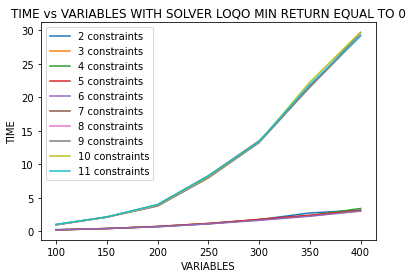

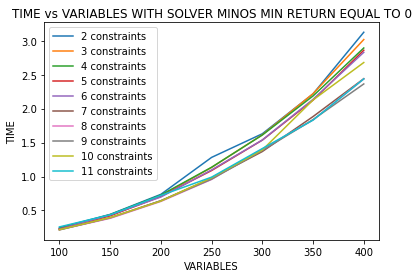

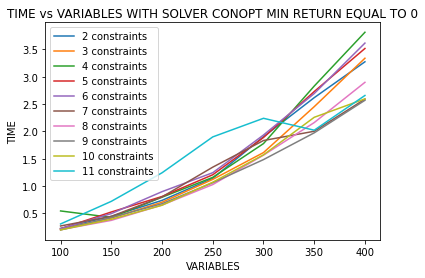

In [ ]:
solver_names = ['LOQO', 'MINOS', 'CONOPT']
solver_algs = [loqo, minos, conopt]
for i, solver in enumerate(solver_algs):
    compare_constraints(solver, 'time', 0, solver_names[i])

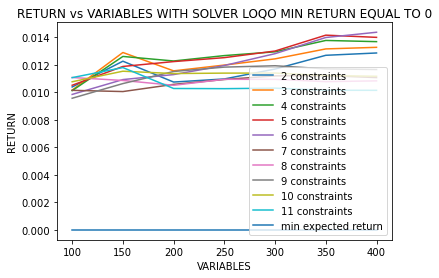

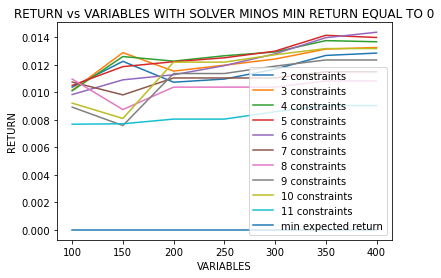

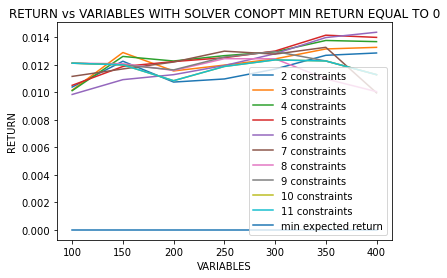

In [ ]:
for i, solver in enumerate(solver_algs):
    compare_constraints(solver, 'return', 0, solver_names[i])

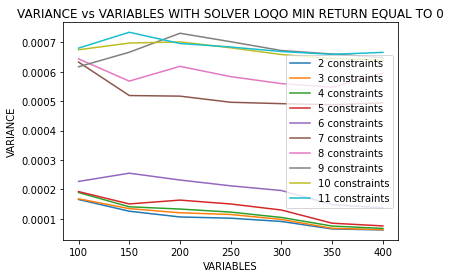

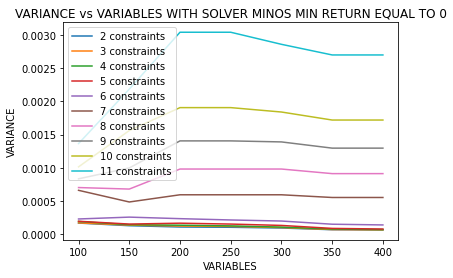

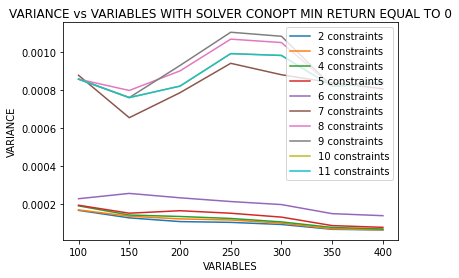

In [ ]:
for i, solver in enumerate(solver_algs):
    compare_constraints(solver, 'variance', 0, solver_names[i])

In [ ]:
plt.close('all')

### Varying Solvers

In [ ]:
def compare_solvers(data, constraint, sensitivity):
    fig, ax = plt.subplots()
    legend_names = ['loqo', 'minos', 'conopt']
    solvers = [loqo, minos, conopt]
    for s in solvers:
        x = list(s[sensitivity][data][constraint+2].keys())
        y = list(s[sensitivity][data][constraint+2].values())
        ax.plot(x, y)
    ax.set_title(data.upper() + ' vs VARIABLES FOR ' + str(i+2) + ' CONSTRAINTS' 
                 + ' WITH MIN RETURN EQUAL TO ' + str(sensitivity))
    ax.set_xlabel('VARIABLES')
    ax.set_ylabel(data.upper())
    if data == 'return':
        ax.plot([100, 150, 200, 250, 300], [sensitivity] * len(x))
        legend_names.append('min expected return')
    ax.legend(legend_names)

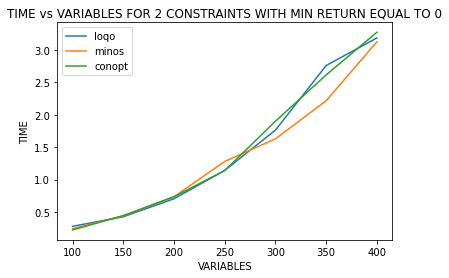

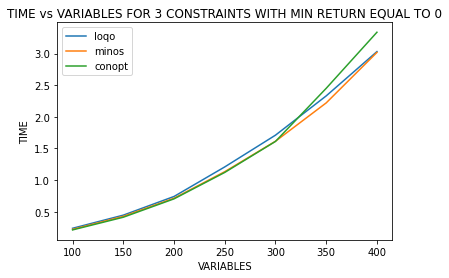

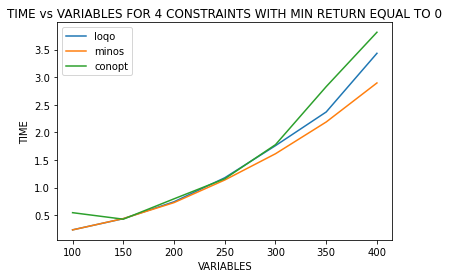

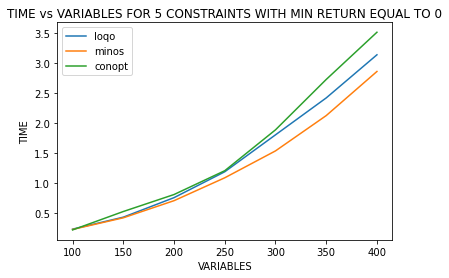

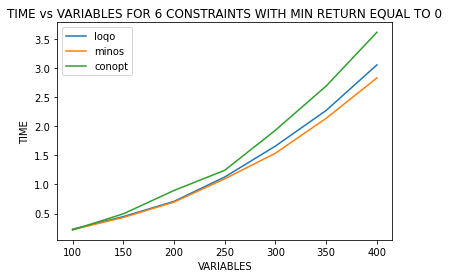

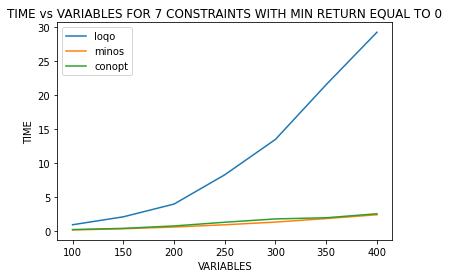

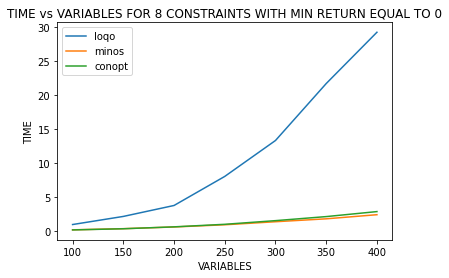

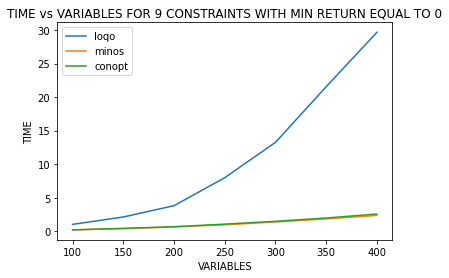

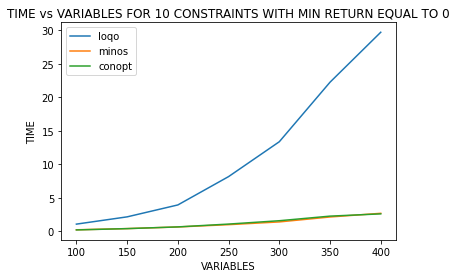

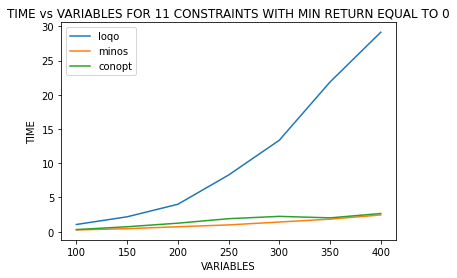

In [ ]:
n = list(range(10))
for i in n:
    compare_solvers('time', i, 0)

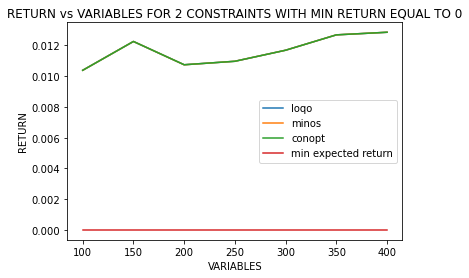

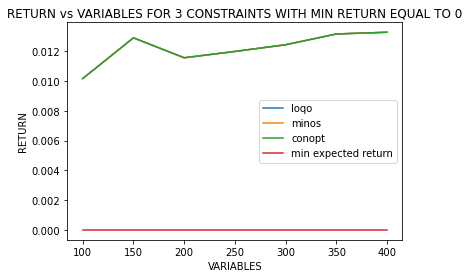

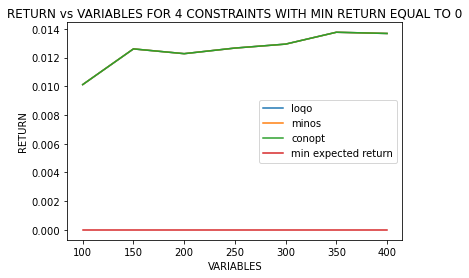

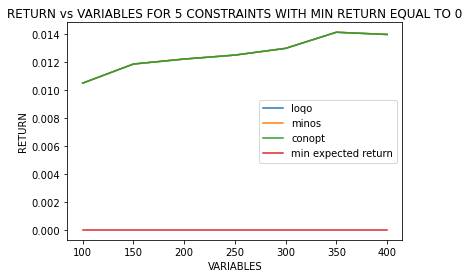

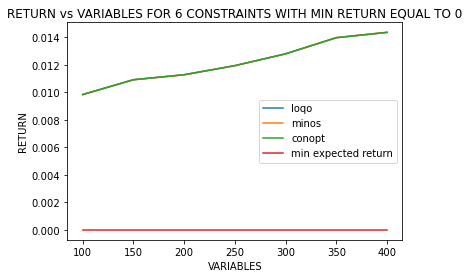

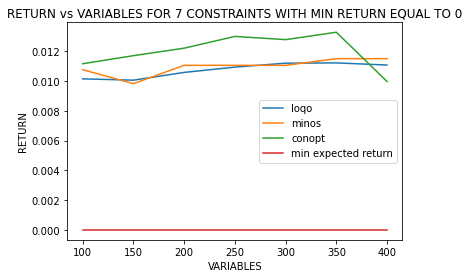

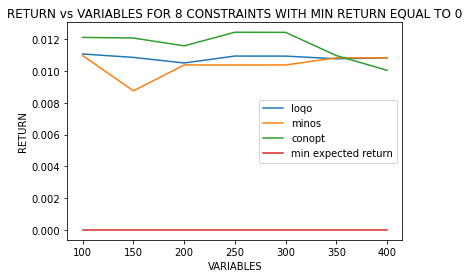

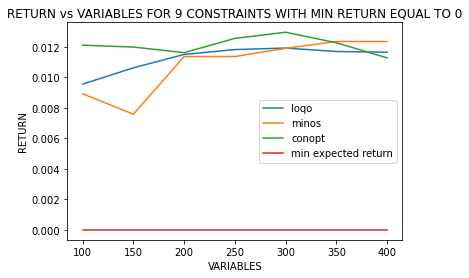

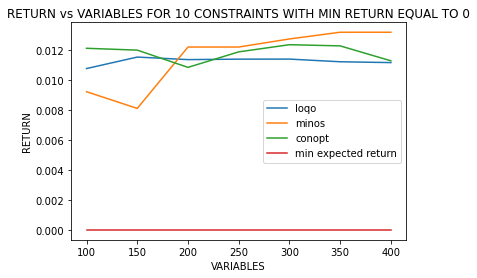

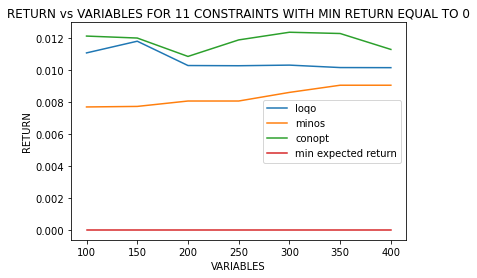

In [ ]:
for i in n:
    compare_solvers('return', i, 0)

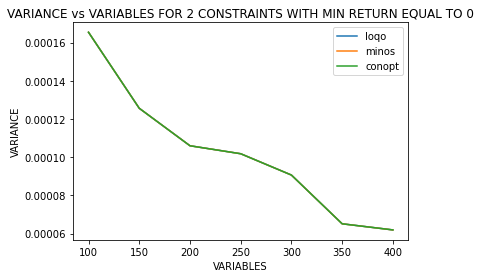

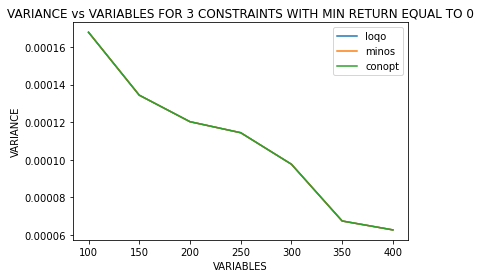

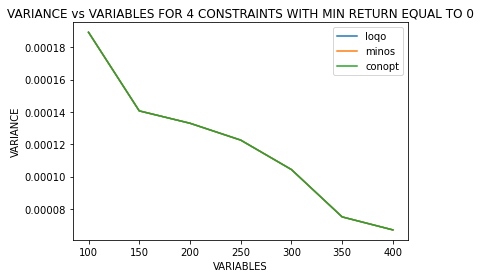

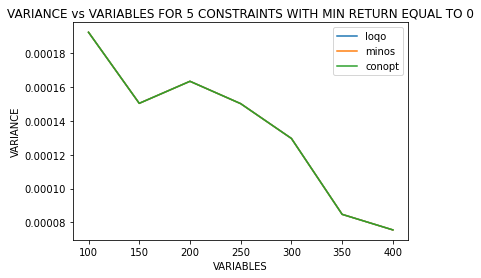

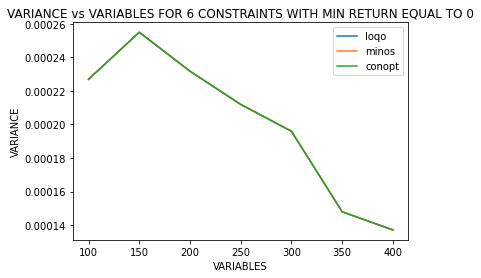

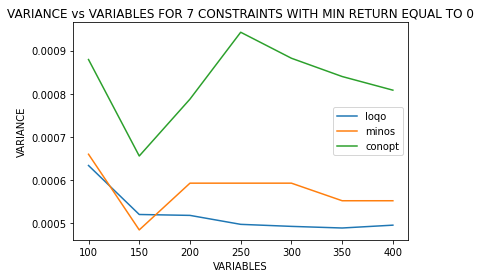

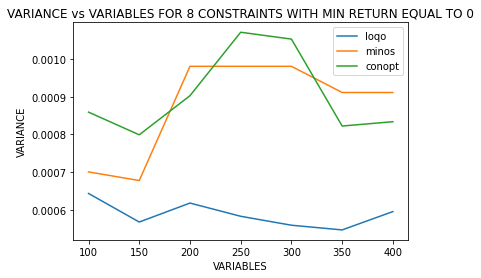

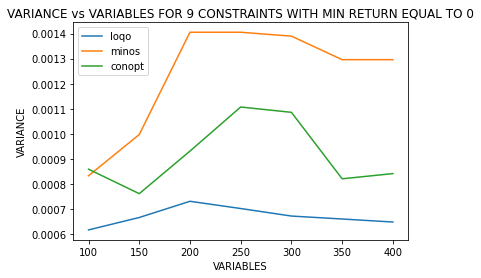

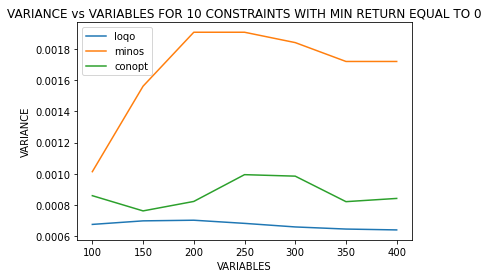

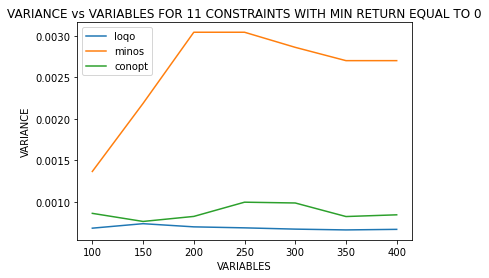

In [ ]:
for i in n:
    compare_solvers('variance', i, 0)

In [ ]:
plt.close('all') 

# Sensitivity Analysis

### Varying Min Expected Return for Solver and Constraints 

In [ ]:
def compare_sensitvity(solver, data, constraint, solver_name):
    s = [0.0, 0.01, 0.02, 0.03, 0.04]
    fig, ax = plt.subplots()
    legend_names = []
    for i in s:
        x = list(solver[i][data][constraint].keys())
        y = list(solver[i][data][constraint].values())
        ax.plot(x, y)
        legend_names.append('min expected return of ' + str(i))
    ax.set_title(data.upper() + ' vs VARIABLES' + ' WITH SOLVER ' 
                 + solver_name + ' CONSTRAINTS ' + str(constraint))
    ax.set_xlabel('VARIABLES')
    ax.set_ylabel(data.upper())
    ax.legend(legend_names)

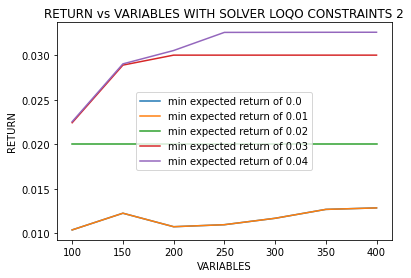

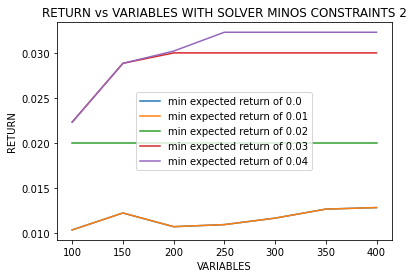

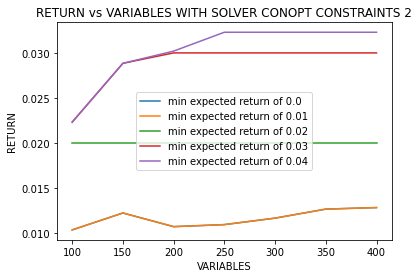

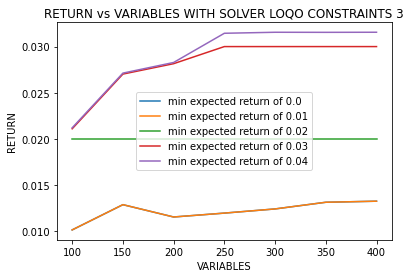

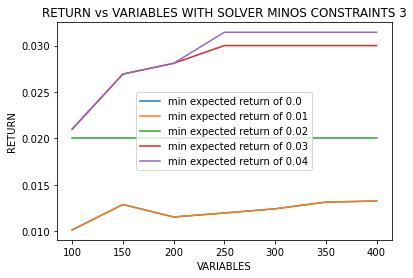

...

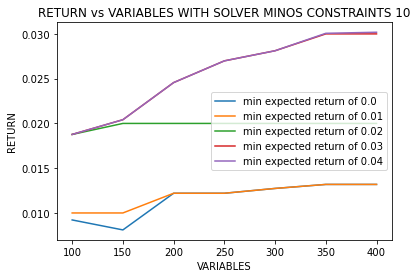

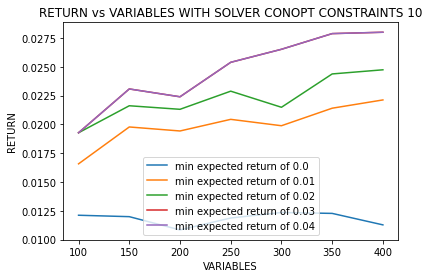

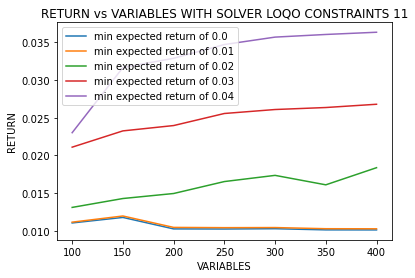

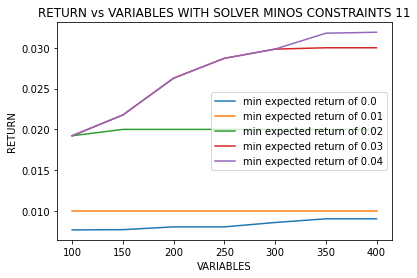

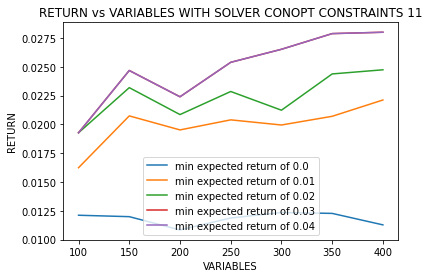

In [ ]:
for k in n:
    for i, solver in enumerate(solver_algs):
        compare_sensitvity(solver, 'return', k+2, solver_names[i])

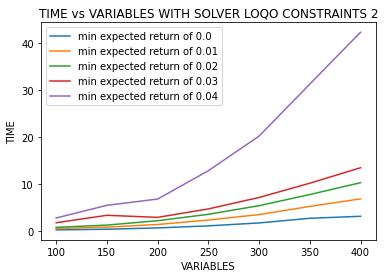

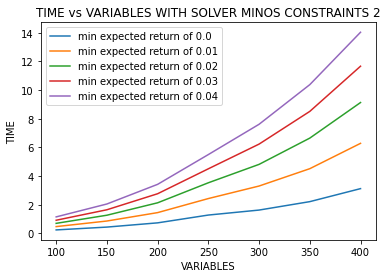

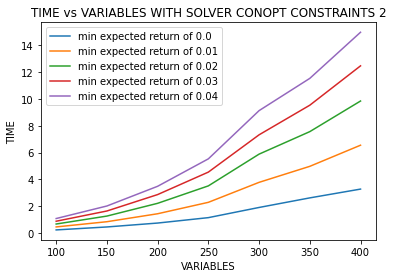

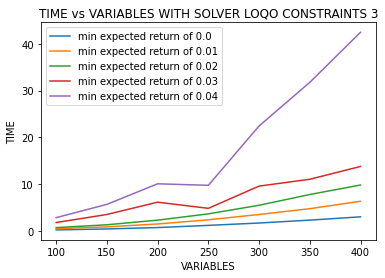

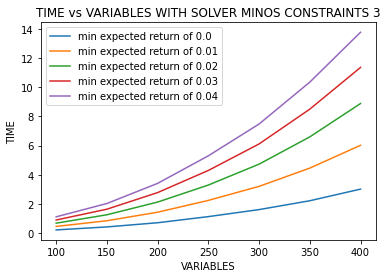

...

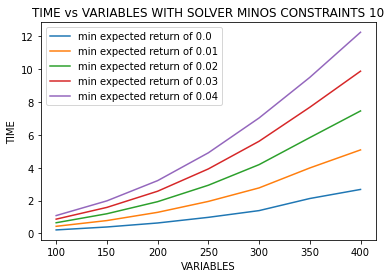

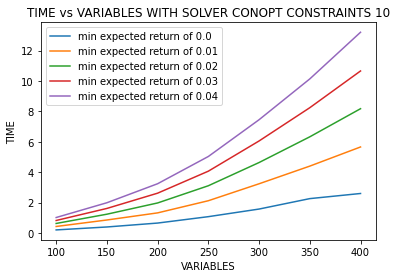

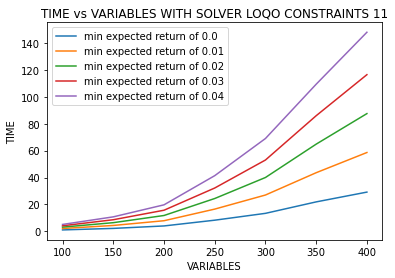

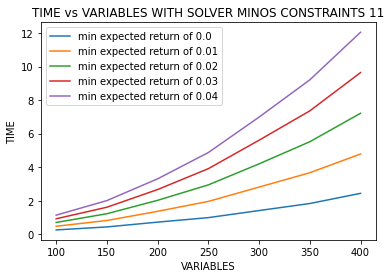

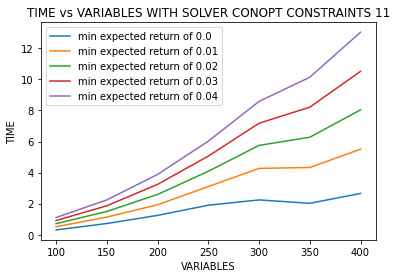

In [ ]:
for k in n:
    for i, solver in enumerate(solver_algs):
        compare_sensitvity(solver, 'time', k+2, solver_names[i])

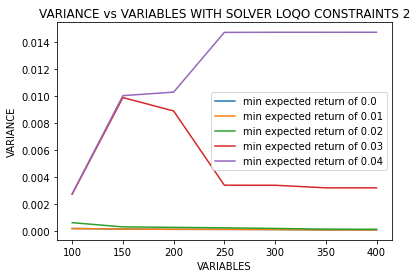

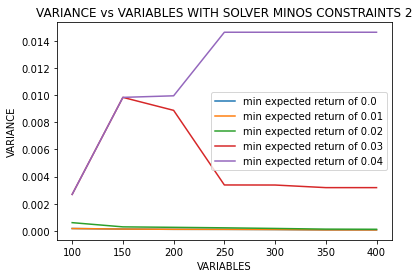

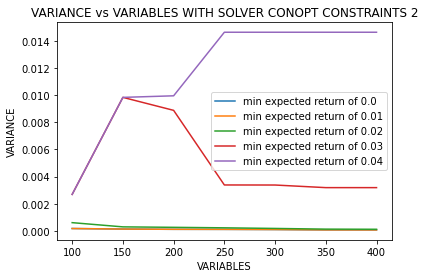

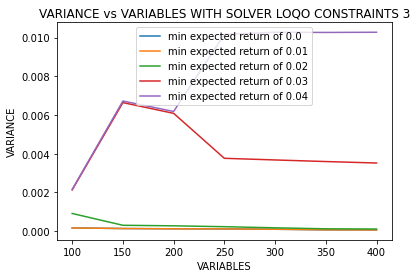

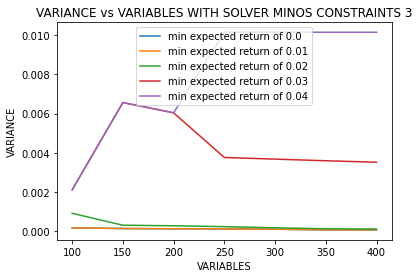

...

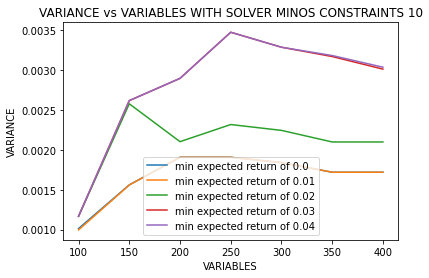

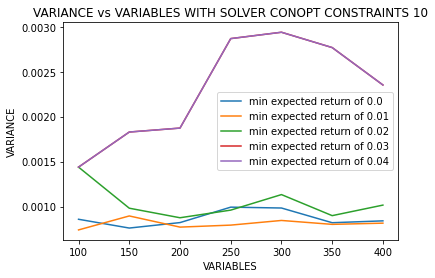

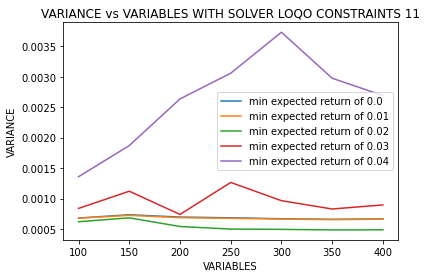

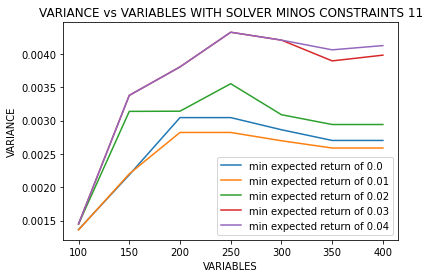

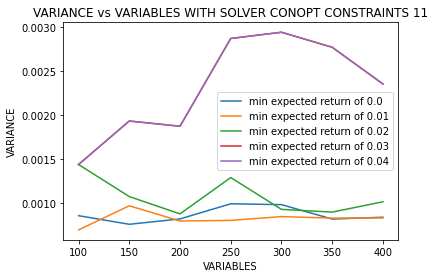

In [ ]:
for k in n:
    for i, solver in enumerate(solver_algs):
        compare_sensitvity(solver, 'variance', k+2, solver_names[i])

In [ ]:
plt.close('all')

### Varying Constriants for Solver and Expected Return

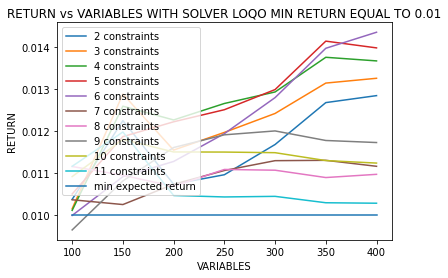

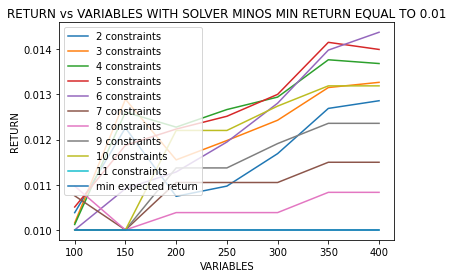

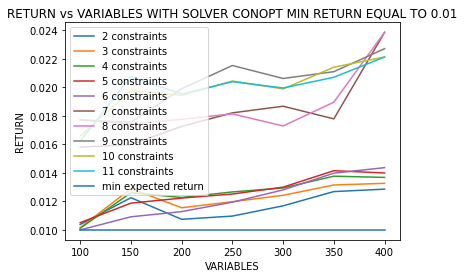

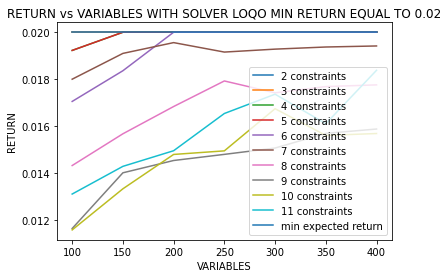

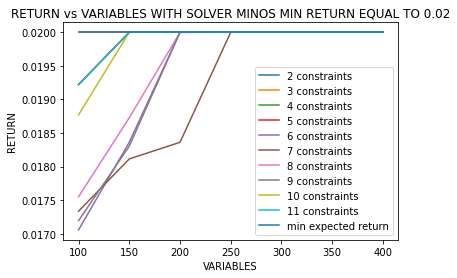

...

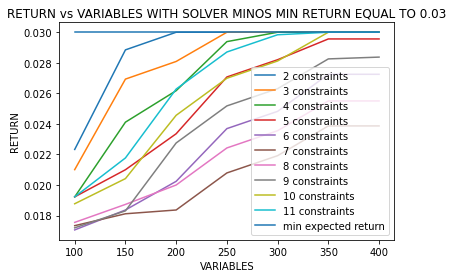

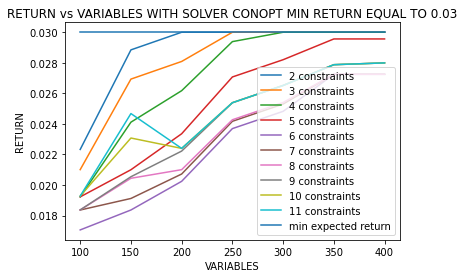

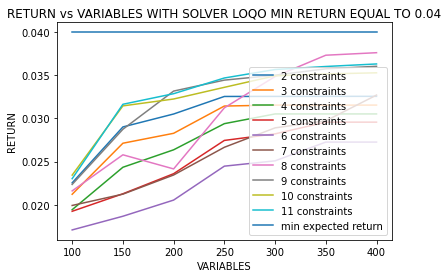

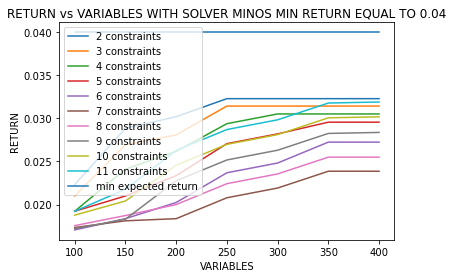

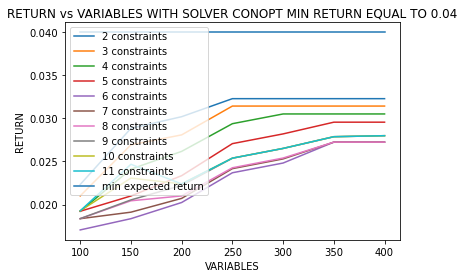

In [ ]:
min_returns = [0.01, 0.02, 0.03, 0.04]
for r in min_returns:
    for i, solver in enumerate(solver_algs):
        compare_constraints(solver, 'return', r, solver_names[i])

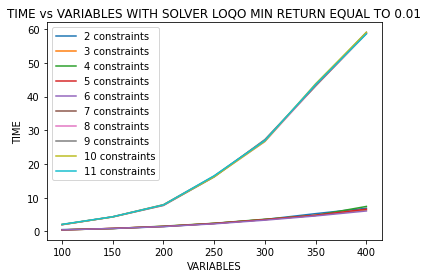

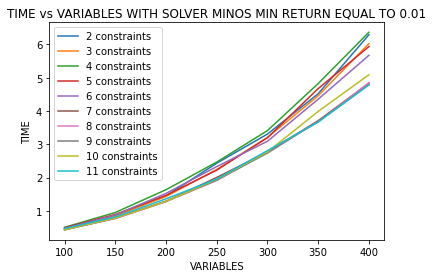

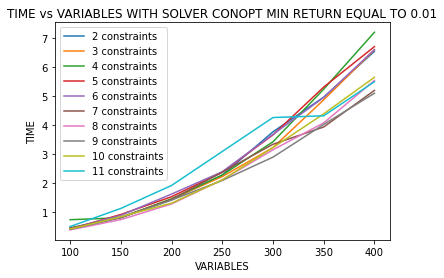

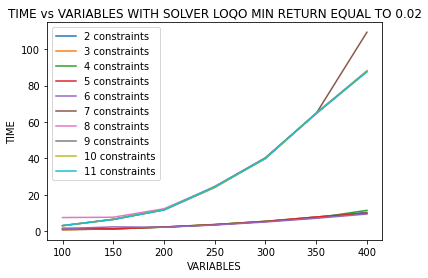

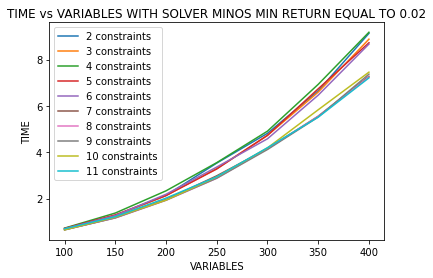

...

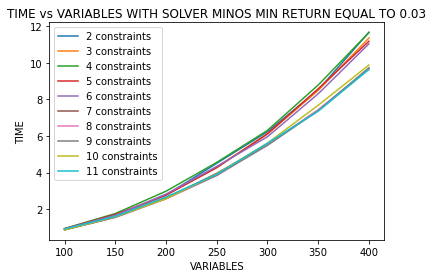

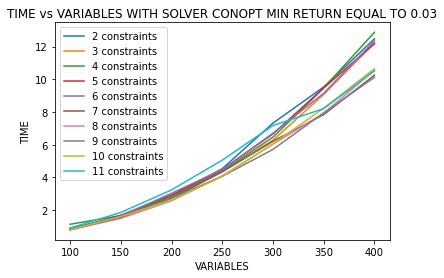

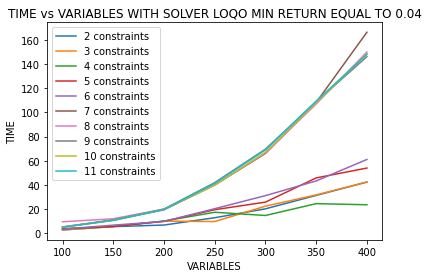

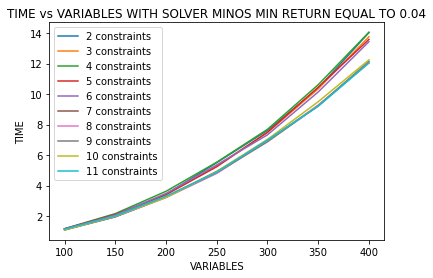

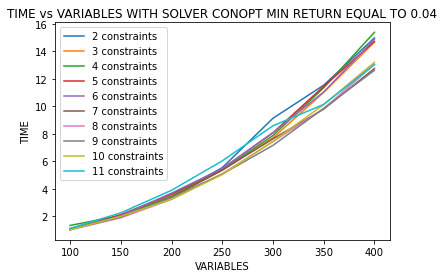

In [ ]:
for r in min_returns:
    for i, solver in enumerate(solver_algs):
        compare_constraints(solver, 'time', r, solver_names[i])

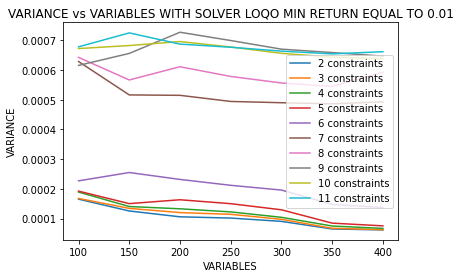

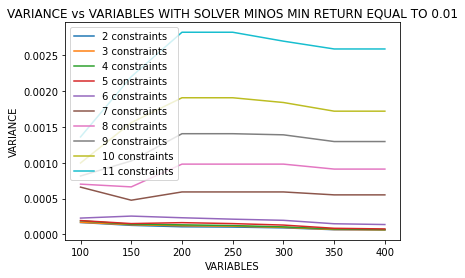

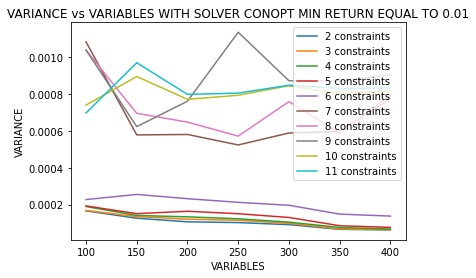

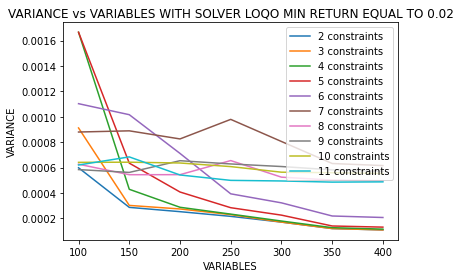

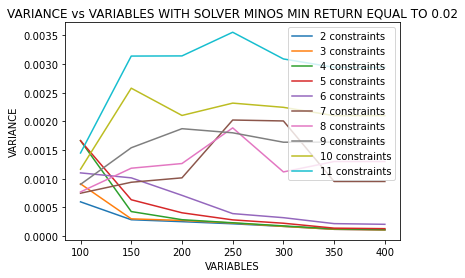

...

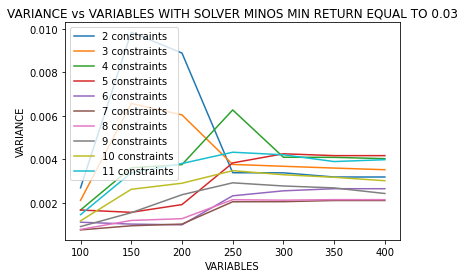

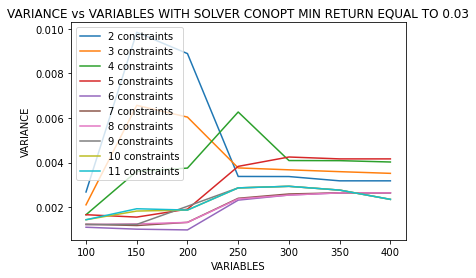

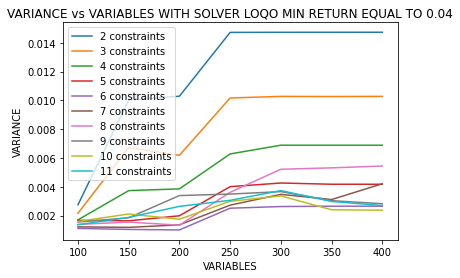

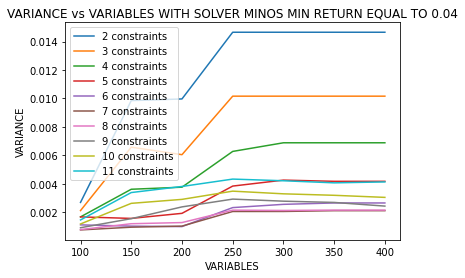

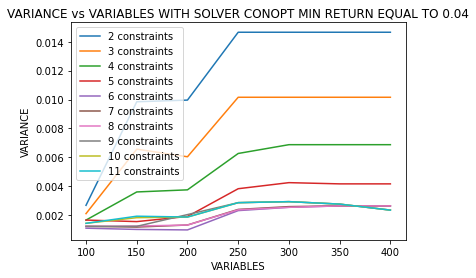

In [ ]:
for r in min_returns:
    for i, solver in enumerate(solver_algs):
        compare_constraints(solver, 'variance', r, solver_names[i])

In [ ]:
plt.close('all')

### Varying Solver for Constraints and Expected Return

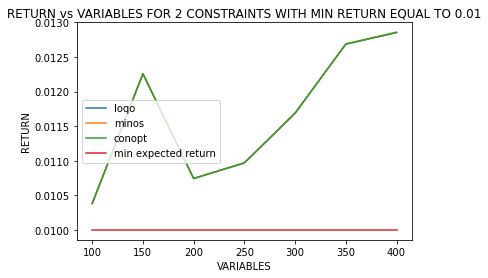

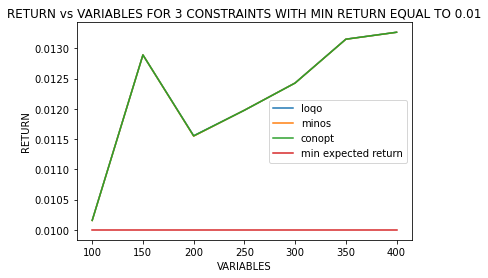

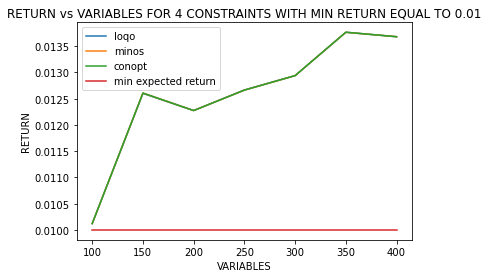

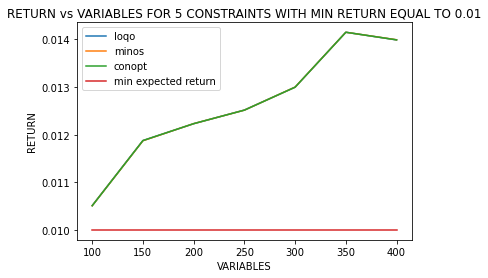

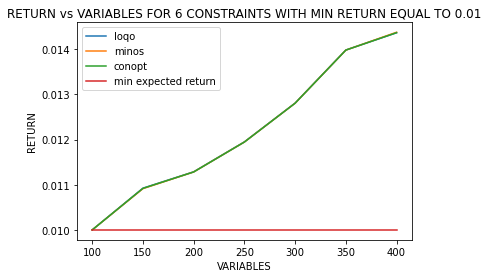

...

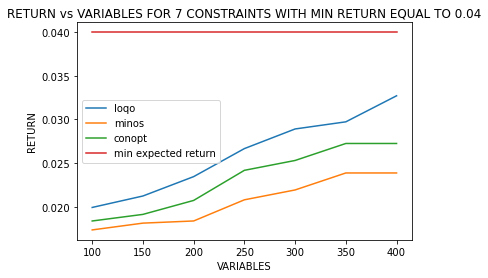

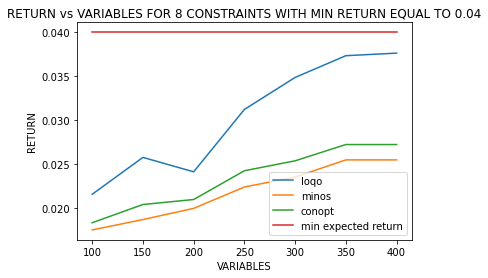

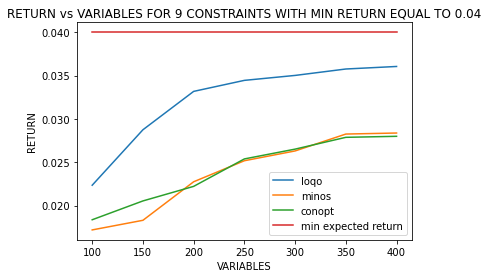

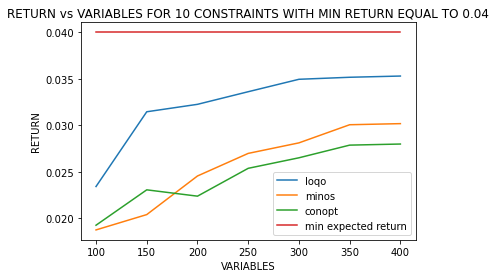

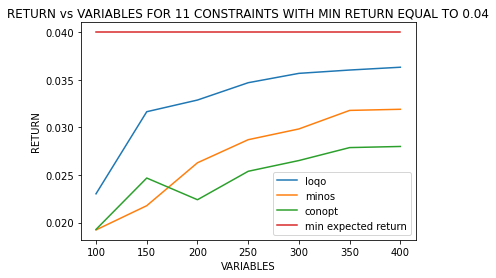

In [ ]:
for r in min_returns:
    for i in n:
        compare_solvers('return', i, r)

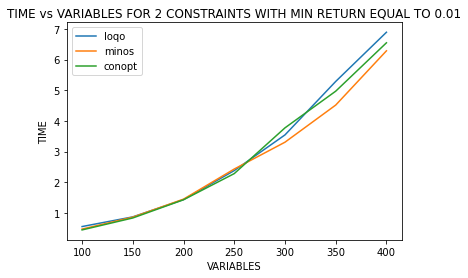

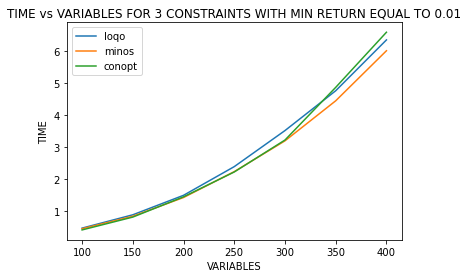

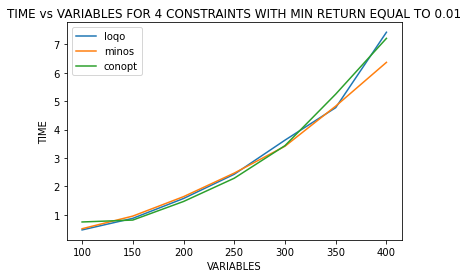

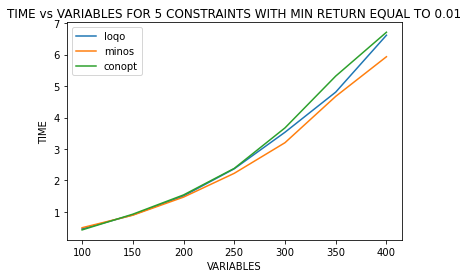

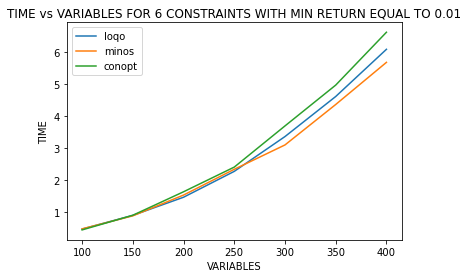

...

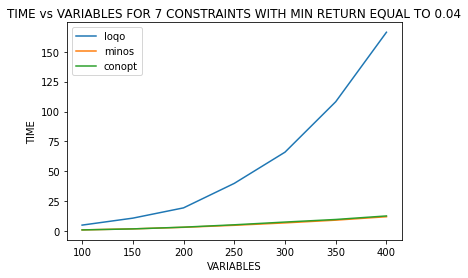

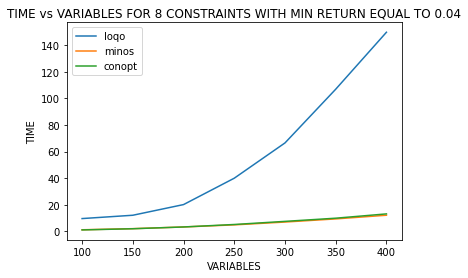

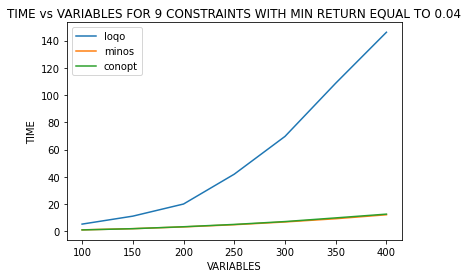

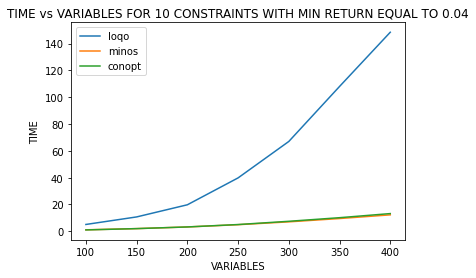

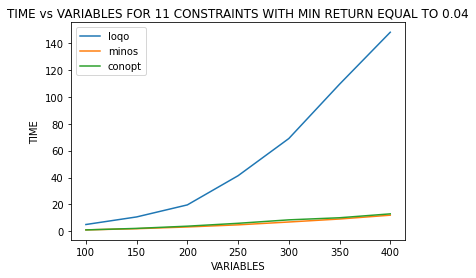

In [ ]:
for r in min_returns:
    for i in n:
        compare_solvers('time', i, r)

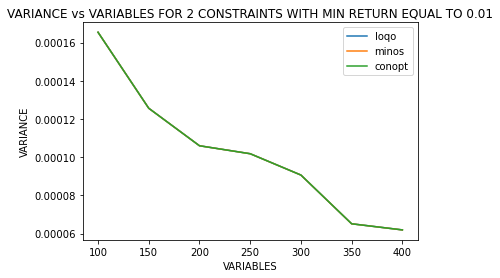

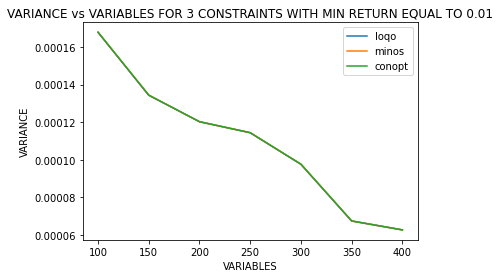

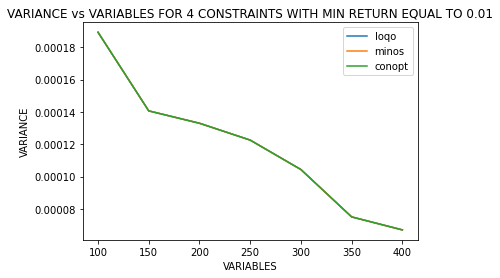

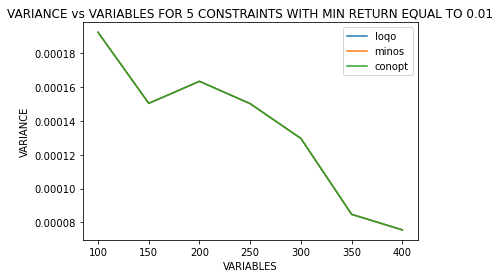

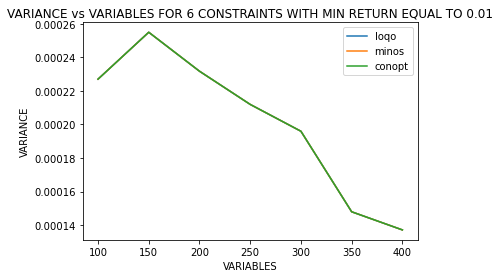

...

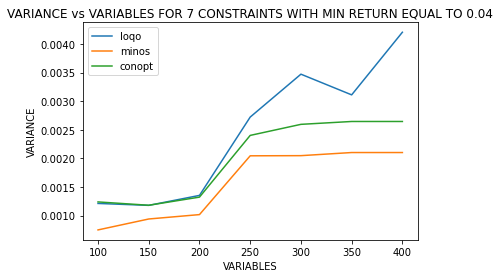

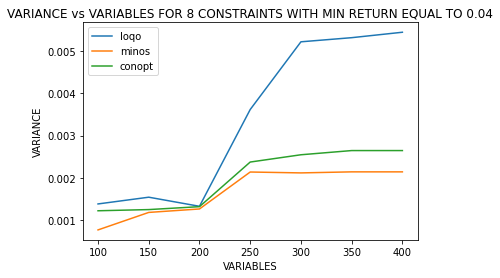

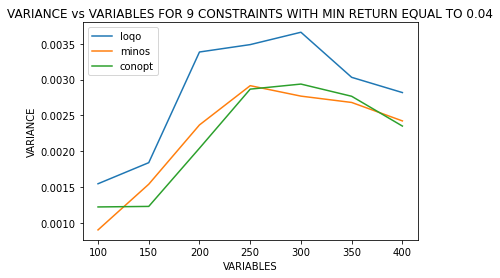

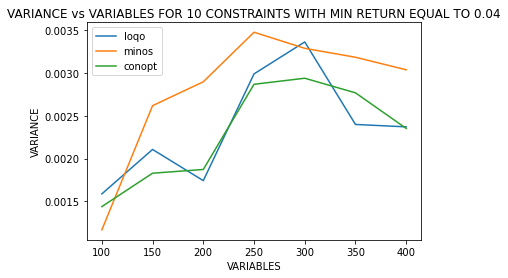

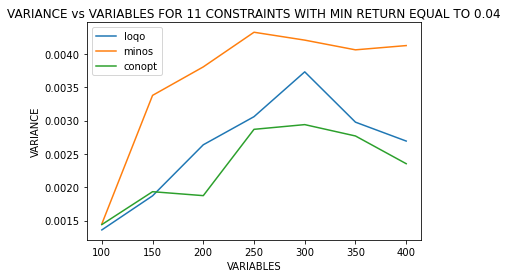

In [ ]:
for r in min_returns:
    for i in n:
        compare_solvers('variance', i, r)

** **Note: minos and conopt are overlapping above** **

In [ ]:
plt.close('all')

# Tables & Heatmaps

In [ ]:
def create_table(data, solver):
    transform_one = {}
    for min_return, outcome in solver.items():
        points = {}
        for constraint, variables in outcome[data].items():
            last_key = 0
            for variable, value in variables.items():
                data_value = points.get(variable)
                if data_value is None:
                    points.update({variable: [value]})
                else:
                    data_value.append(value)
                    points.update({variable: data_value})
        transform_one[min_return] = points
    transform_two = {}
    for min_return, outcome in transform_one.items():
        for variables, values in outcome.items():
            transform_two[(min_return, variables)] = values
    df = pd.DataFrame(transform_two).T
    df.columns = df.columns + 2
    return df
    

In [ ]:
def create_heatmap(data, title):
    minos_table = create_table(data, minos)
    minos_table.columns = pd.MultiIndex.from_product([["minos"], minos_table.columns])
    conopt_table = create_table(data, conopt)
    conopt_table.columns = pd.MultiIndex.from_product([["conopt"], conopt_table.columns])
    loqo_table = create_table(data, loqo)
    loqo_table.columns = pd.MultiIndex.from_product([["loqo"], loqo_table.columns])
    all_solvers = pd.concat([loqo_table, conopt_table, minos_table],axis=1)
    fig, ax = plt.subplots(figsize=(30,20))
    time_output = sns.heatmap(all_solvers, annot=True)
    time_output.set(xlabel='Min Expected Return - Variables', 
                    ylabel='Solver - Constraints', 
                    title=title)
    return minos_table, conopt_table, loqo_table

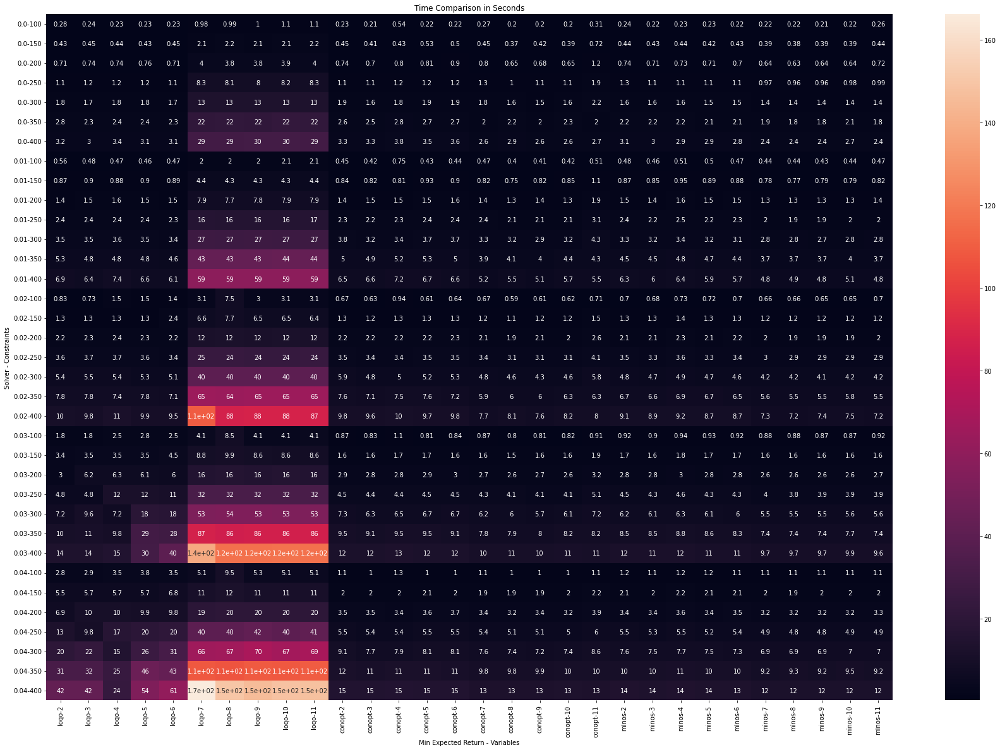

In [ ]:
minos_t, conopt_t, loqo_t = create_heatmap('time', 'Time Comparison in Seconds')

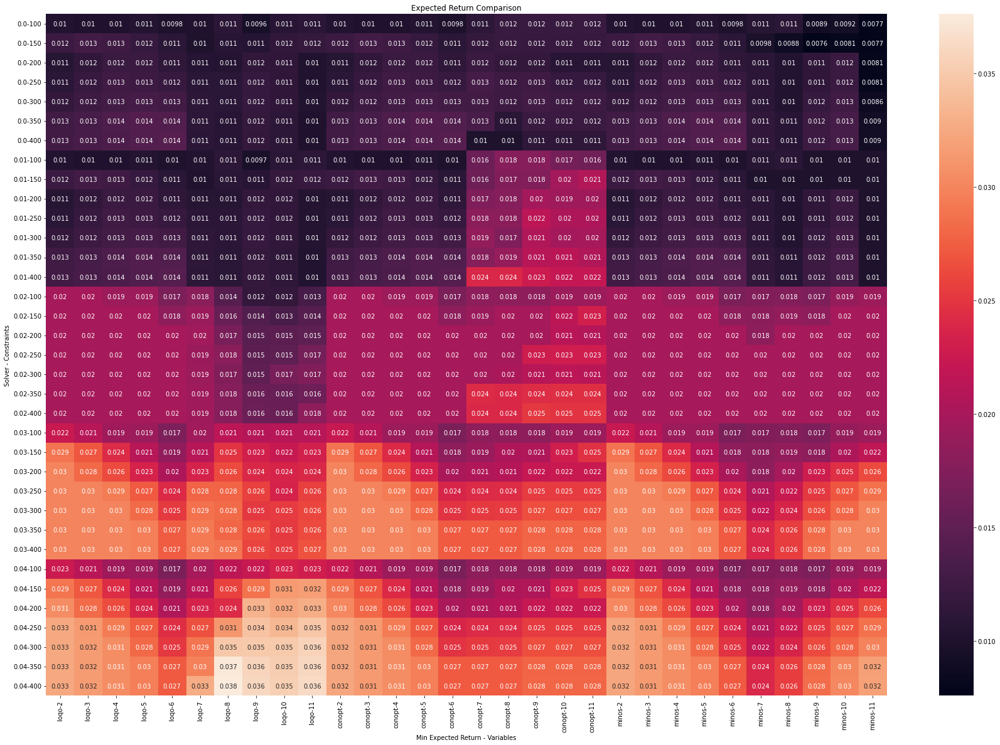

In [ ]:
minos_r, conopt_r, loqo_r = create_heatmap('return', 'Expected Return Comparison')

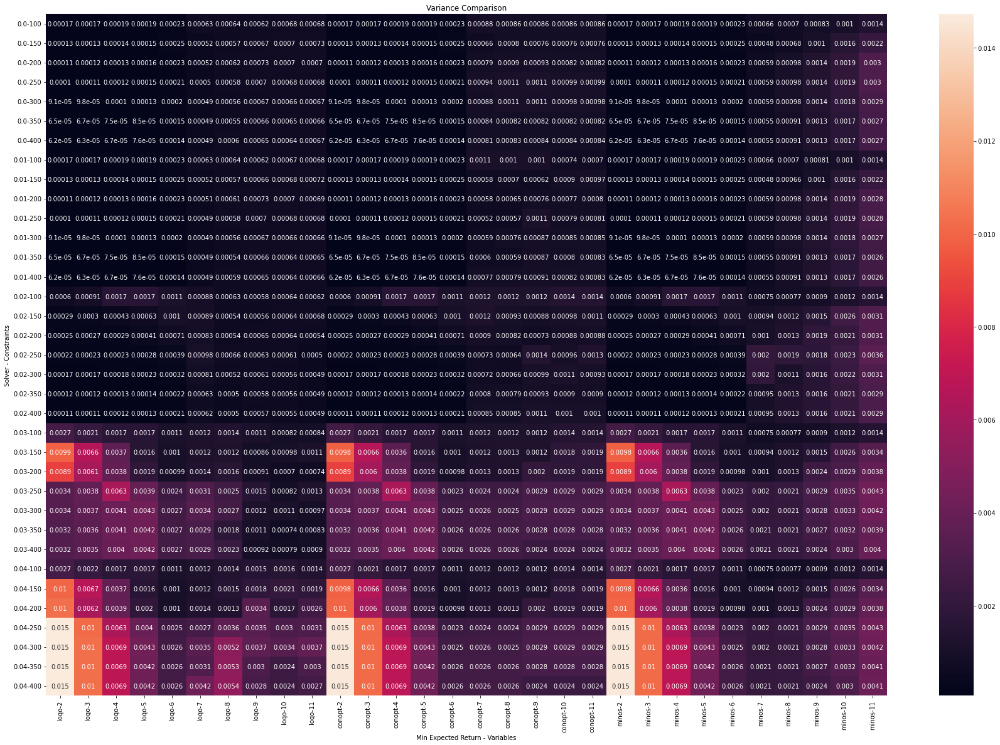

In [ ]:
minos_v, conopt_v, loqo_v = create_heatmap('variance', 'Variance Comparison')

# Correlation & Covariance Analysis

In [ ]:
def analyze_covariance():
    var = [100, 150, 200, 250, 300]
    result = dict()
    for v in var:
        for k, value in covariances[v].items():
            s1, s2 = k
            result.setdefault(s1, {}).update({s2: value})
        cov = np.array(pd.DataFrame(result))
        det = np.linalg.det(cov)
        if cov.shape[0] == cov.shape[1] and np.linalg.matrix_rank(cov) == cov.shape[0]:
            print('Matrix with ' + str(v) + ' variables is invertible')
        else:
            print('Matrix with ' + str(v) + ' variables is not invertible')
            
def analyze_correlations(v):
    corr = pd.DataFrame(correlations[v])
    fig, ax = plt.subplots(figsize=(30,20))
    output = sns.heatmap(corr)
    output.set(xlabel='Stocks', 
                    ylabel='Stocks', 
                    title='Correlation Among Stocks')

In [ ]:
analyze_covariance()

Matrix with 100 variables is invertible
Matrix with 150 variables is not invertible
Matrix with 200 variables is not invertible
Matrix with 250 variables is not invertible
Matrix with 300 variables is not invertible
Matrix with 350 variables is not invertible
Matrix with 400 variables is not invertible


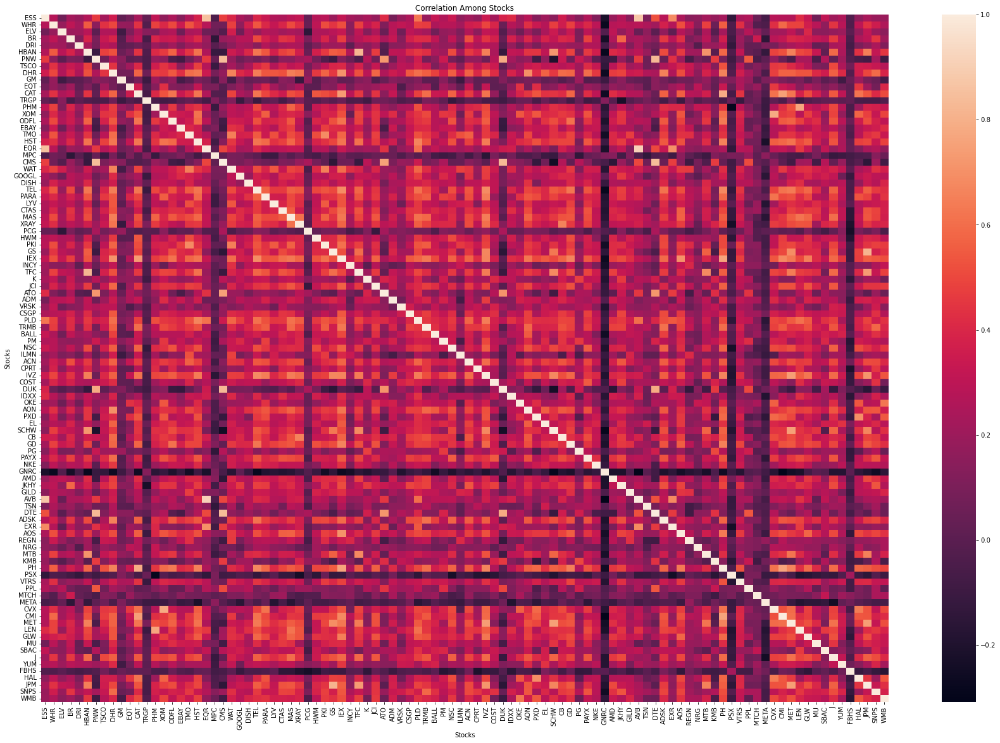

In [ ]:
analyze_correlations(100)

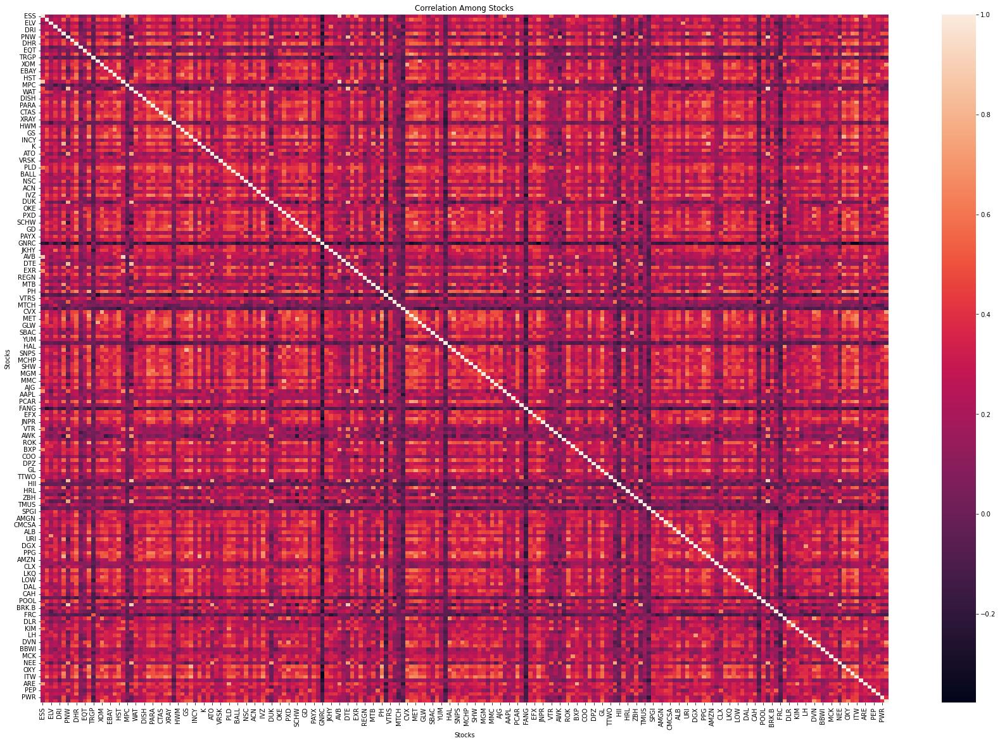

In [ ]:
analyze_correlations(200)

In [ ]:
plt.close('all')